Notebook used to nicely display the training results from the logs

In [2]:
%load_ext autoreload
%autoreload 2

import os
from typing import List

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from keras.utils.np_utils import to_categorical
from keras.models import load_model
from keras.applications import resnet_v2
import keras.preprocessing.image_dataset

from nn.utils import calculate_metrics, calculate_concept_metrics, ds_unzip


In [2]:
project_dir = "/Users/Cherry0904/Desktop/roko-for-charlize"
base_dir = f'{project_dir}'
large_data_dir = f"{base_dir}/Thesis_Data"
model_dir = f"{large_data_dir}/Models"
FEATURE_EXTRACTOR = 'Resnet50V2'
features_dir = f'{large_data_dir}/Feature_vectors_{FEATURE_EXTRACTOR}'

## Load Data

In [19]:
# Parse the wrong format to the correct one
# path = os.path.join(project_dir, "Extracted_Concepts/final_dict_new_codex.pkl")
# luke_output = pd.read_pickle(path)

path = os.path.join(project_dir, "Extracted_Concepts/artemis_concrete_final_dict_old_codex.pkl")
luke_output = pd.read_pickle(path)
concepts_text = np.array(luke_output["explanations"])

labels_keys = ['id', 'label', 'concepts']
labels_dict = {key: luke_output[key] for key in labels_keys}
labels_df_filtered = pd.DataFrame.from_dict(labels_dict)

labels = labels_df_filtered.copy()
labels_df_filtered


,id,label,concepts
0,andre-derain_boats-at-collioure-1905,amusement,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,camille-pissarro_paul-emile-pissarro-1890,sadness,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,camille-pissarro_peasant-woman-warming-herself...,sadness,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,camille-pissarro_portrait-of-nini-1884,sadness,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,camille-pissarro_railroad-to-dieppe-1886,something else,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
...,...,...,...
220,william-james-glackens_under-the-trees,amusement,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
221,yiannis-tsaroychis_cafe-neon-at-day-1965,something else,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
222,yiannis-tsaroychis_p308(1),contentment,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
223,yiannis-tsaroychis_the-forgoten-guards,disgust,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [4]:
concepts_text = np.array(luke_output["explanations"])
binary_image_concepts = np.array(['overall red', 'overall green', 'overall blue', 'large colour variation', 'high saturation', 
                                  'high global contrast','high local contrast', 'frequent repeated pattern', 
                                  'large number of lines','averagely long lines'])
concepts_text = np.concatenate((binary_image_concepts, concepts_text), axis=None)
# print(concepts_text.shape)

num_classes = 9 # Change it
n_concepts = 130 # Change it

classes = np.array(['amusement', 'awe', 'contentment', 'excitement' 'anger', 'disgust', 'fear', 'sadness', 'something else'])

class_dict = {
    'amusement': 0,
    'awe': 1,
    'contentment': 2,
    'excitement': 3,
    'anger': 4,
    'disgust': 5, 
    'fear': 6, 
    'sadness': 7, 
    'something else': 8}

inv_class_dict = {v: k for k, v in class_dict.items()}

concept_matrix = labels['concepts'].values
print(concept_matrix)
concept_matrix = np.stack(concept_matrix, axis=0)
idx = np.argwhere(np.all(concept_matrix[..., :] == 0, axis=0))
concept_matrix = np.delete(concept_matrix, idx, axis=1)
concept_matrix = concept_matrix[:, :n_concepts]
print(concept_matrix.shape)

y = np.array([class_dict[label] for label in labels['label']])

y_binary = to_categorical(y, num_classes)
print(y_binary.shape)

X_train0 = X[:549, :, :]
y_train_binary = y_binary[:549, :]
X_test0 = X[549:, :, :]
y_test_binary = y_binary[549:, :]
concept_train = concept_matrix[:549, :]
concept_test = concept_matrix[549:, :]
id_train0 = np.array(labels["id"].values)[:549]
id_test0 = np.array(labels["id"].values)[549:]

print(X_train0.shape)
print(y_train_binary.shape)
print(concept_train.shape)
print(X_test0.shape)
print(y_test_binary.shape)
print(concept_test.shape)
print(id_train0.shape)
print(id_test0.shape)

[array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0])
 array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0])
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

NameError: name 'X' is not defined

In [62]:
#Load BEST Trained Model
model_id = "1652610884"
model = load_model(model_dir + f'/best_concept_Conv_attn_{n_concepts}_{model_id}.h5')
print(model.summary())

Model: "Video_concepts"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_1 (InputLayer)           [(None, 360, 2048)]  0           []                               
                                                                                                  
 Conv_1 (Conv1D)                (None, 360, 64)      393280      ['Input_1[0][0]']                
                                                                                                  
 Max_pool_1 (MaxPooling1D)      (None, 90, 64)       0           ['Conv_1[0][0]']                 
                                                                                                  
 Bn_1 (BatchNormalization)      (None, 90, 64)       256         ['Max_pool_1[0][0]']             
                                                                                     

In [63]:
network_type = 'concept_Conv_attn'

if (network_type == 'Conv1D' or network_type == 'LSTM'):
    cf_matrix, accuracy, macro_f1, mismatch, y_pred, = calculate_metrics(model, X_test0,
                                                                         y_test_binary)
    print('Accuracy : {}'.format(accuracy))
    print('F1-score : {}'.format(macro_f1))
    print(cf_matrix)

else:
    cf_matrix, accuracy, macro_f1, mismatch, y_pred, cf_concepts, accuracy_concepts = calculate_concept_metrics(model,
                                                                                                                X_test0,
                                                                                                                y_test_binary,
                                                                                                                concept_test)

    print('Accuracy : {}'.format(accuracy))
    print('F1-score : {}'.format(macro_f1))
    print(cf_matrix)
    print(cf_concepts)
    print(accuracy_concepts)

Accuracy : 0.6666666666666666
F1-score : 0.6445073375262054
[[22 13  1  6  0]
 [15 24  1  7  1]
 [ 0  0 60  0  2]
 [ 7  5  3 21  1]
 [ 2  0  8  1 19]]
[[15895   808]
 [  223   156]]
0.9396440697810561


In [9]:
print(X_data.shape)

(2000, 224, 224, 3)


## For concepts to labels training

In [452]:
def idx_lookup(df, row_key, value):
    return df[row_key][df[row_key] == value].index[0]

def preprocess_data(images, labels):
    return resnet_v2.preprocess_input(images), labels

# def to_image_ids(file_paths:List[str]) -> List[str]:
def to_image_ids(file_paths):
    return [pathlib.PurePath(file_path).name[:-4] for file_path in file_paths]
    # return [re.match(r".*/([a-zA-Z0-9_]+)\.jpg", file_path).group(1) for file_path in file_paths]


In [467]:
import pathlib
import tensorflow as tf

n_concepts = 290 + 10 # Change it

dataset_train_split = 1325 # 1500  # Change it: (0.75, 0.1, 0.15)
dataset_val_point = 1501 # 1501 1700 # Change it

# Location where 2000 subset of artemis is stored
dir = '/Users/Cherry0904/Desktop/pn_artemis_images_2000_ds'
dataset = keras.preprocessing.image_dataset.image_dataset_from_directory(dir, image_size=(224, 224), batch_size=1,
                                                                         shuffle=False)

X_data, _, _ = ds_unzip(dataset, use_concepts=False)
X_data = resnet_v2.preprocess_input(X_data)

project_dir = '/Users/Cherry0904/Desktop/roko-for-charlize'

path = os.path.join(
    f"{project_dir}/Extracted_Concepts/artemis_pn_2000_0.9_final_dict_old_codex.pkl")
luke_output = pd.read_pickle(path)
concepts_text = np.array(luke_output["explanations"])

labels_keys = ['id', 'label', 'concepts']
labels_dict = {key: luke_output[key] for key in labels_keys}
labels = pd.DataFrame.from_dict(labels_dict)

# Add the binary image features to each concept array by matching the image_name
binary_img_features_df_csv = '/Users/Cherry0904/Desktop/binary_img_features_each_image.csv'

binary_img_features_df = pd.read_csv(binary_img_features_df_csv)
# binary_img_features_df['binary_feature_vector'] = binary_img_features_df['binary_feature_vector'].apply(literal_eval) # Turn the string into a list (not array)
new_df = pd.merge(labels, binary_img_features_df, on='id', how='left')
new_df = new_df.fillna(0) # Fill all the NaN values with 0
new_df['binary_feature_vector'] = new_df[['overall_red', 'overall_green', 'overall_blue',
       'large_hue_variation', 'high_saturation', 'high_global_contrast',
       'high_local_contrast', 'frequent_repeated_pattern',
       'large_number_of_lines', 'long_lines_on_average']].values.tolist()
new_df = new_df[['id', 'label', 'concepts', 'binary_feature_vector']]
# Append each binary image feature vector to the concept array
new_df['merged_concepts'] = new_df.apply(lambda x: np.append(np.asarray(x.binary_feature_vector), x.concepts), axis = 1)
# Replace the original concept array in 'labels' with the updated one 
labels['concepts'] = new_df['merged_concepts']
# print(labels.columns)

# print(labels['id'].iloc[0])
# print(dataset.file_paths[0])

ds_img_ids = to_image_ids(dataset.file_paths)
concept_list_ids = [idx_lookup(labels, "id", img_id) for img_id in ds_img_ids]
# Return the list of concept arrays corresponding to the images in the repo
concept_list = [tf.convert_to_tensor(labels["concepts"].iloc[id]) for id in concept_list_ids] 
label_list = [labels["label"].iloc[id] for id in concept_list_ids]
# print(concept_list)

binary_image_concepts = np.array(['(I) overall red', '(I) overall green', '(I) overall blue', '(I) large colour variation', '(I) high saturation', 
                                '(I) high global contrast', '(I) high local contrast', '(I) frequently repeated pattern', 
                                '(I) large number of lines', '(I) averagely long lines'])
concepts_text = np.concatenate((binary_image_concepts, concepts_text), axis=None)
# print(concepts_text.shape)

num_classes = 2 # Change it
classes = np.array(['positive', 'negative'])
class_dict = {'positive': 0, 'negative': 1}

inv_class_dict = {v: k for k, v in class_dict.items()}


y_binary = [tf.constant(tf.keras.utils.to_categorical(class_dict[label], num_classes), shape=[num_classes, ]) for label in label_list] 
y_data = [{"c_probs": c, "probs": y} for c, y in zip(concept_list, y_binary)]

def y_generator_fun():
    for y in y_data:
        # print(y)
        yield y

X_dataset = tf.data.Dataset.from_tensor_slices(X_data)
y_dataset = tf.data.Dataset.from_generator(y_generator_fun, output_signature=({
    "c_probs": tf.TensorSpec(shape=(n_concepts,)),
    "probs": tf.TensorSpec(shape=(num_classes,)) # "probs": tf.TensorSpec(shape=())
}))
preprocesed_dataset = tf.data.Dataset.zip((X_dataset, y_dataset)).batch(1)
# print(preprocesed_dataset)

X, y, c = ds_unzip(preprocesed_dataset, use_concepts=True)
# print(y.shape)

# Manually shuffling because tf dataset shuffle doesn't work
indices = tf.range(start=0, limit=tf.shape(X)[0], dtype=tf.int32)
shuffled_indices = tf.random.shuffle(indices) # seed = 789

X = tf.gather(X, shuffled_indices)
y = tf.gather(y, shuffled_indices)
c = tf.gather(c, shuffled_indices)

# X_train, y_train, c_train = ds_unzip(preprocesed_dataset, use_concepts=True)
# X_test, y_test, c_test = ds_unzip(shuffled_dataset, use_concepts=True)
X_train = X[:dataset_train_split]
X_val = X[dataset_train_split:dataset_val_point]
X_test = X[dataset_val_point:]
y_train = y[:dataset_train_split]
y_val = y[dataset_train_split:dataset_val_point]
y_test = y[dataset_val_point:]
c_train = c[:dataset_train_split]
c_val = c[dataset_train_split:dataset_val_point]
c_test = c[dataset_val_point:]

    


Found 1766 files belonging to 1 classes.


True label is: positive


/var/folders/6f/6ngp6cds4hq9z7fnmw29_d2m0000gn/T/ipykernel_30493/3979489635.py:34: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  pred_attn = attention[true_concepts]
/var/folders/6f/6ngp6cds4hq9z7fnmw29_d2m0000gn/T/ipykernel_30493/3979489635.py:35: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  pred_text = concepts_text[true_concepts]


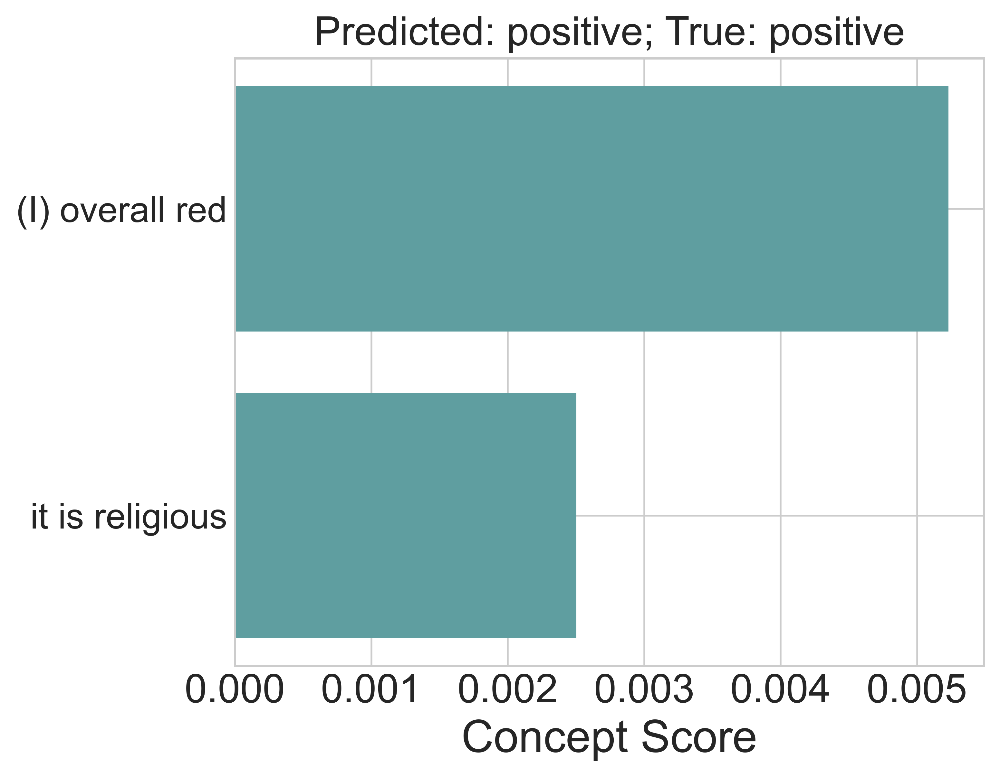

/Users/Cherry0904/Desktop/roko-for-charlize/nn/utils.py:441: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/Users/Cherry0904/Desktop/roko-for-charlize/nn/utils.py:442: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  #     plt.rcdefaults()


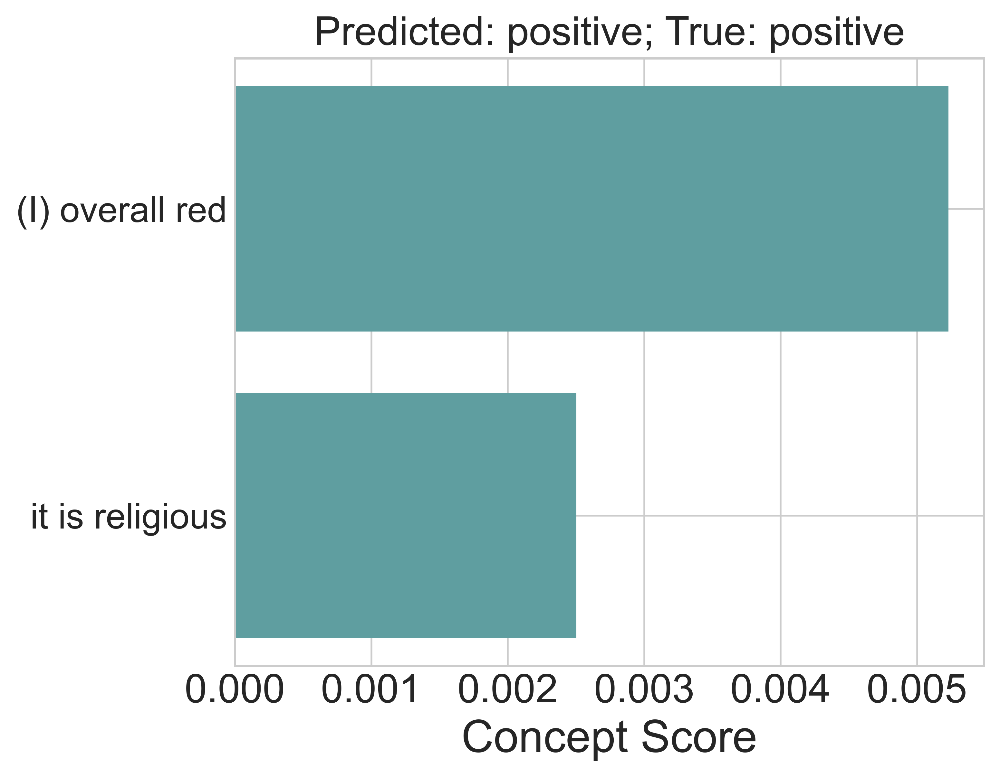

[[0.57631147 0.42882496]]
['(I) overall red' 'it is religious']
[0.00522869 0.00250346]


In [350]:
from keras.models import Model

# Get output after attention
def get_attention(model, layer_name, input_data):
    intermediate_layer_model = Model(inputs=model.input,
                                     outputs=model.get_layer(layer_name).output)
    intermediate_output = intermediate_layer_model.predict(input_data)
    return intermediate_output

# Try visualise the trial model on artemis
curr_point = 245
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
model = load_model(model_dir + '/final_concept_only_atten_artemis_1660663017.h5')
print(f"True label is: {label_list[curr_point]}")
test_input = concept_list[curr_point]
# test_input = tf.reshape(test_input, [-1, 300])
test_input = np.expand_dims(test_input, axis=0)
# print(test_input.shape)
pred = model.predict(test_input)
pred_label = np.argmax(pred, axis=1)[0]
pred_class = inv_class_dict[pred_label]
# true_concepts = np.where(test_input > 0)
zero = tf.constant(0, dtype=tf.float32)
true_concepts = tf.where(tf.not_equal(test_input, zero))

# print(pred)
# print(pred_label)
# print(pred_class)
# print(true_concepts)

attention = np.squeeze(get_attention(model, 'attn_score', test_input))
# print(attention)
# print(len(attention))
pred_attn = attention[true_concepts]
pred_text = concepts_text[true_concepts]

# print(pred_attn)
# print(pred_text)

plt.style.use('seaborn-whitegrid')
plt.rcParams.update({'font.size': 18, "figure.dpi": 500})
fig, ax = plt.subplots(figsize=(6, 5))
true_class = 'positive'

y_pos = np.arange(len(pred_text))
ax.barh(y_pos, pred_attn, align='center', color='cadetblue')
ax.set_yticks(y_pos)
ax.set_yticklabels(pred_text, fontsize=16)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Concept Score', fontsize=20)
ax.set_title(f'Predicted: {pred_class}; True: {true_class}', fontsize=18)
plt.show()

from nn.utils import visualize_concepts_simple
pred, pred_label, pred_attn, pred_text = visualize_concepts_simple(concept_list[curr_point], 'positive', model,
                                                                concepts_text, inv_class_dict)
print(pred)
print(pred_text)
print(pred_attn)

In [468]:
from nn.utils import return_predicted_class_simple, return_attention_weights_and_index, visualize_concepts

## shuffled_indices = [] # Copy it from img_classifier.py results
# indices = tf.range(start=0, limit=tf.shape(X_data)[0], dtype=tf.int32)
# shuffled_indices = tf.random.shuffle(indices)
indices = tf.range(start=0, limit=1766, dtype=tf.int32) # Change the number of data points/images
shuffled_indices = tf.random.shuffle(indices, seed = 789)
c_data = tf.gather(concept_list, shuffled_indices)
dataset_val_point = 1501 # Change this
tensor_of_test_indices = shuffled_indices[dataset_val_point:]

# curr_point = 126
# network_type = "image_classifier_network"
# network_type = 'concept_Conv_attn'
# X_visualize = X_data[curr_point]
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
# model = load_model(model_dir + '/final_concept_only_atten_artemis_1660663017.h5') # '/final_concept_full_artemis_300_1660726417.h5')
model = load_model(model_dir + '/final_concept_only_atten_artemis_1660663017.h5')
pred_class_list = [] 
for i in range(tensor_of_test_indices.shape[0]):
    pred_class_list.append(return_predicted_class_simple(c_data[tensor_of_test_indices[i]], model, inv_class_dict))

# print(pred_class_list)
# X_visualize = X_data[tensor_of_test_indices[0]] # Loop over all test points
# y_true = label_list[curr_point]
y_true = []
for i in range(tensor_of_test_indices.shape[0]):
    y_true.append(label_list[tensor_of_test_indices[i]])
# print(y_true)
# print(f"The image id we are observing is {birds_img_ids[curr_point]}")
# print(concepts_text.shape)

pred_class_list_full = []
for i in range(1766):
    pred_class_list_full.append(return_predicted_class_simple(c_data[i], model, inv_class_dict))

# print(pred_class_list_full)

y_true_full = []
for i in range(1766):
    y_true_full.append(label_list[i])

# print(y_true_full)


In [469]:
# Print the indexes where the true label and predicted label are the same
def return_same_label_indices(a, b, label):
  return [i for i, v in enumerate(a) if v == b[i] == label]

def return_unequal_label_indices(a, b, true_label, pred_label):
  return [i for i, v in enumerate(a) if v == true_label and b[i] == pred_label]

# contentment_index_list = return_same_label_indices(y_true, pred_class_list, 'contentment')
# awe_index_list = return_same_label_indices(y_true, pred_class_list, 'awe')
# se_index_list = return_same_label_indices(y_true, pred_class_list, 'something else')

# print(awe_index_list)
# print(se_index_list)

# positive_index_list = return_same_label_indices(y_true, pred_class_list, 'positive')
# negative_index_list = return_same_label_indices(y_true, pred_class_list, 'negative')
# wrong_positive_index_list = return_unequal_label_indices(y_true, pred_class_list, 'positive', 'negative')
# wrong_negative_index_list = return_unequal_label_indices(y_true, pred_class_list, 'negative', 'positive')

full_positive_index_list = return_same_label_indices(y_true_full, pred_class_list_full, 'positive')
full_negative_index_list = return_same_label_indices(y_true_full, pred_class_list_full, 'negative')
full_wrong_positive_index_list = return_unequal_label_indices(y_true_full, pred_class_list_full, 'positive', 'negative')
full_wrong_negative_index_list = return_unequal_label_indices(y_true_full, pred_class_list_full, 'negative', 'positive')

# print(full_positive_index_list)
# print(full_negative_index_list)
# print(full_wrong_positive_index_list)
# print(full_wrong_negative_index_list)


In [462]:
from nn.utils import return_attention_weights_and_index_simple
# from nn.utils import return_attention_weights_and_index

num_of_concepts = 290+10
num_of_same_label_index = len(full_positive_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = full_positive_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index_simple(c_data[cur_point], model)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
pos_final_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(pos_final_ave_pred_atten)
pos_final_pred_index = np.where(pos_final_ave_pred_atten != 0)[0]
print(pos_final_pred_index)

[8.64227393e-04 1.47974399e-04 4.82760279e-05 5.75550215e-06
 0.00000000e+00 4.54493634e-05 4.14338991e-05 2.10985976e-05
 1.38357521e-05 6.86305562e-06 1.42390396e-05 9.90975995e-04
 3.69550368e-04 0.00000000e+00 0.00000000e+00 1.97652421e-04
 0.00000000e+00 1.97182135e-04 1.88459520e-04 0.00000000e+00
 0.00000000e+00 2.14133936e-06 4.73585388e-06 3.50975759e-05
 0.00000000e+00 0.00000000e+00 3.16988872e-06 1.05721899e-04
 1.34741415e-04 8.93555078e-05 2.58209179e-05 4.69728958e-06
 7.95777968e-05 0.00000000e+00 7.59404772e-05 8.34965556e-06
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 2.13200491e-06 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 3.64472516e-05 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 5.21276416e-05 9.20443331e-06
 5.42905417e-06 8.323523

In [456]:
from nn.utils import return_attention_weights_and_index_simple
# from nn.utils import return_attention_weights_and_index

num_of_concepts = 290+10
num_of_same_label_index = len(full_negative_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = full_negative_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index_simple(c_data[cur_point], model)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
neg_final_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(neg_final_ave_pred_atten)
neg_final_pred_index = np.where(neg_final_ave_pred_atten != 0)[0]
print(neg_final_pred_index)

[2.99065863e-03 1.01469249e-04 1.06187841e-04 3.45572217e-04
 3.44550760e-04 3.30316546e-05 0.00000000e+00 9.69642197e-05
 0.00000000e+00 3.13006874e-05 5.27311718e-03 0.00000000e+00
 1.28660901e-04 2.76889204e-04 1.14670520e-04 0.00000000e+00
 2.82171001e-04 0.00000000e+00 0.00000000e+00 3.38732025e-04
 0.00000000e+00 2.33133811e-05 0.00000000e+00 3.65579585e-04
 1.37158390e-04 1.71494200e-04 9.26289264e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 5.61380129e-04 0.00000000e+00
 0.00000000e+00 1.76771686e-04 0.00000000e+00 2.07852758e-04
 2.36850693e-04 8.50658442e-05 0.00000000e+00 5.82008534e-05
 8.78204015e-05 1.20678424e-04 1.64835226e-04 9.46471202e-05
 9.01920898e-05 0.00000000e+00 8.86501922e-05 7.83005463e-05
 7.27894849e-05 4.40107925e-05 2.15567427e-05 7.20269712e-05
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.29629164e-05
 0.00000000e+00 0.00000000e+00 0.00000000e+00 2.16307966e-04
 1.07437266e-04 1.80823826e-04 0.00000000e+00 2.38750729e-05
 2.48022812e-04 3.184777

In [470]:
from nn.utils import return_attention_weights_and_index_simple
# from nn.utils import return_attention_weights_and_index

num_of_concepts = 290+10
num_of_same_label_index = len(full_wrong_positive_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = full_wrong_positive_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index_simple(c_data[cur_point], model)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
wrong_pos_final_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(wrong_pos_final_ave_pred_atten)
wrong_pos_final_pred_index = np.where(wrong_pos_final_ave_pred_atten != 0)[0]
print(wrong_pos_final_pred_index)

[2.31141067e-03 9.83298645e-05 7.83315605e-05 2.76500492e-04
 1.76836661e-04 1.31191526e-04 7.11996929e-05 1.09670342e-04
 1.48793782e-05 3.08230896e-05 5.82933116e-03 0.00000000e+00
 5.82059934e-05 4.40233074e-04 2.41007691e-04 0.00000000e+00
 1.33118710e-04 0.00000000e+00 0.00000000e+00 1.05311522e-04
 4.34128701e-05 1.16566906e-05 0.00000000e+00 2.45932718e-04
 4.98444928e-05 1.36965757e-04 4.63144632e-05 0.00000000e+00
 0.00000000e+00 2.74623545e-05 5.57996100e-04 0.00000000e+00
 0.00000000e+00 7.86297201e-05 0.00000000e+00 1.00848708e-04
 2.81133064e-04 8.97302703e-05 3.63210793e-05 0.00000000e+00
 0.00000000e+00 3.60991229e-05 4.12088065e-05 8.80711268e-05
 4.50960449e-05 6.47216681e-05 8.08229182e-05 8.43795726e-05
 8.51313584e-05 4.70643242e-05 1.07783713e-05 8.10789077e-05
 8.77071926e-05 6.30169486e-05 6.17364909e-05 8.43395878e-05
 9.10849798e-05 0.00000000e+00 1.19297484e-04 7.67837855e-05
 1.11418559e-04 1.93756828e-04 0.00000000e+00 1.19375364e-05
 1.47890641e-04 2.880920

In [356]:
from nn.utils import return_attention_weights_and_index_simple
# from nn.utils import return_attention_weights_and_index

num_of_concepts = 290+10
num_of_same_label_index = len(full_wrong_negative_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = full_wrong_negative_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index_simple(c_data[cur_point], model)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
wrong_neg_final_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(wrong_neg_final_ave_pred_atten)
wrong_neg_final_pred_index = np.where(wrong_neg_final_ave_pred_atten != 0)[0]
print(wrong_neg_final_pred_index)

[1.18294614e-03 1.73121964e-04 3.02887712e-05 0.00000000e+00
 4.88438986e-05 4.81449125e-05 3.34471265e-05 0.00000000e+00
 1.31476804e-05 1.58105758e-05 1.28377899e-03 9.40383602e-04
 3.01870063e-04 5.34861216e-05 0.00000000e+00 2.48954533e-04
 0.00000000e+00 1.32748352e-04 1.95451516e-04 4.53455830e-05
 2.46534067e-05 0.00000000e+00 0.00000000e+00 5.58358598e-05
 5.87821672e-05 3.67487572e-05 2.32613246e-05 1.48617750e-04
 7.69473232e-05 7.12482848e-05 9.08191753e-05 0.00000000e+00
 2.97191705e-05 3.51465744e-05 1.09740913e-04 7.76490729e-05
 3.61200916e-05 0.00000000e+00 3.11323537e-05 0.00000000e+00
 3.76373149e-05 0.00000000e+00 0.00000000e+00 4.05630515e-05
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 8.96364051e-05 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 2.28226698e-05 9.14787037e-06
 0.00000000e+00 0.000000

In [395]:
from nn.utils import visualize_average_attention
visualize_average_attention(pos_final_pred_index, pos_final_ave_pred_atten, 'Positive', 'Positive', concepts_text)


array([1.05592840e-03, 8.21759506e-04, 4.73148166e-04, 2.27266740e-04,
       1.73720027e-04, 1.54175158e-04, 1.38498503e-04, 1.27842574e-04,
       1.17925910e-04, 9.79625135e-05, 9.49576927e-05, 8.53120022e-05,
       6.90883726e-05, 6.36638005e-05, 5.19876986e-05, 5.12208716e-05,
       4.99436419e-05, 4.82957584e-05, 4.65166450e-05, 4.01531752e-05])

In [459]:
from nn.utils import visualize_average_attention
visualize_average_attention(neg_final_pred_index, neg_final_ave_pred_atten, 'negative', 'negative', concepts_text)

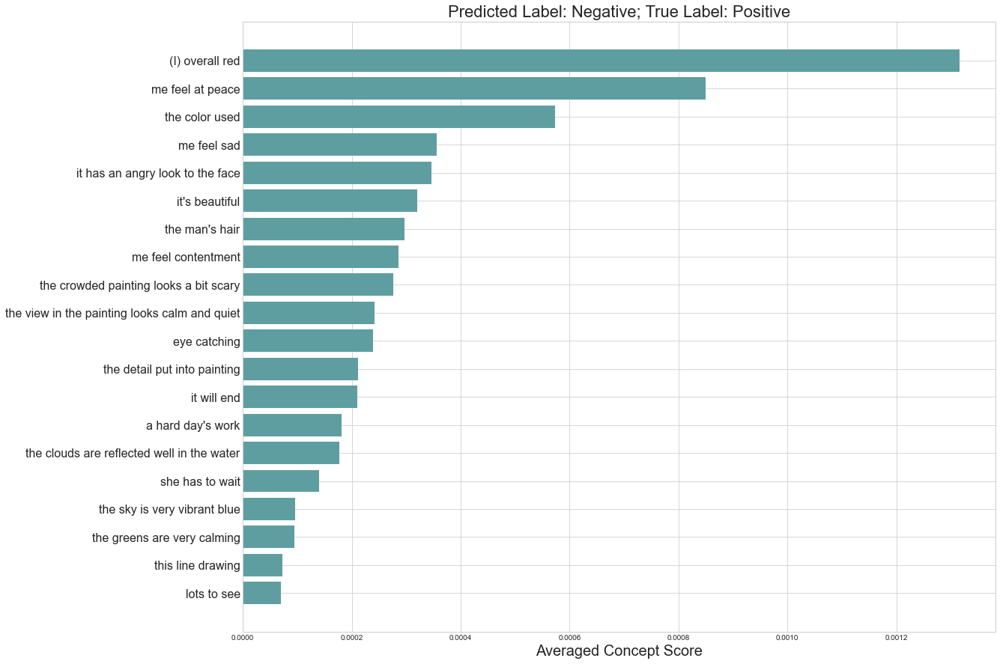

In [3]:
from nn.utils import visualize_average_attention
visualize_average_attention(neg_final_pred_index, neg_final_ave_pred_atten, 'negative', 'negative', concepts_text)

In [401]:
from nn.utils import visualize_average_attention
visualize_average_attention(wrong_neg_final_pred_index, wrong_neg_final_ave_pred_atten, 'Positive', 'Negative', concepts_text)


array([1.28377899e-03, 1.18294614e-03, 9.40383602e-04, 3.01870063e-04,
       2.48954533e-04, 1.95451516e-04, 1.73121964e-04, 1.48617750e-04,
       1.32748352e-04, 1.11249604e-04, 1.09740913e-04, 9.59120463e-05,
       9.08191753e-05, 8.96364051e-05, 7.76490729e-05, 7.69473232e-05,
       7.12482848e-05, 6.57973431e-05, 5.88911357e-05, 5.87821672e-05])

## Joint training 

In [ ]:
def idx_lookup(df, row_key, value):
    return df[row_key][df[row_key] == value].index[0]

def preprocess_data(images, labels):
    return resnet_v2.preprocess_input(images), labels

# def to_image_ids(file_paths:List[str]) -> List[str]:
def to_image_ids(file_paths):
    return [pathlib.PurePath(file_path).name[:-4] for file_path in file_paths]
    # return [re.match(r".*/([a-zA-Z0-9_]+)\.jpg", file_path).group(1) for file_path in file_paths]


In [ ]:
import pathlib
import tensorflow as tf

n_concepts = 290 + 10 # Change it

dataset_train_split = 1325 # 1500  # Change it: (0.75, 0.1, 0.15)
dataset_val_point = 1501 # 1501 1700 # Change it

# Location where 2000 subset of artemis is stored
dir = '/Users/Cherry0904/Desktop/pn_artemis_images_2000_ds'
dataset = keras.preprocessing.image_dataset.image_dataset_from_directory(dir, image_size=(224, 224), batch_size=1,
                                                                         shuffle=False)

X_data, _, _ = ds_unzip(dataset, use_concepts=False)
X_data = resnet_v2.preprocess_input(X_data)

project_dir = '/Users/Cherry0904/Desktop/roko-for-charlize'

path = os.path.join(
    f"{project_dir}/Extracted_Concepts/artemis_pn_2000_0.9_final_dict_old_codex.pkl")
luke_output = pd.read_pickle(path)
concepts_text = np.array(luke_output["explanations"])

labels_keys = ['id', 'label', 'concepts']
labels_dict = {key: luke_output[key] for key in labels_keys}
labels = pd.DataFrame.from_dict(labels_dict)

# Add the binary image features to each concept array by matching the image_name
binary_img_features_df_csv = '/Users/Cherry0904/Desktop/binary_img_features_each_image.csv'

binary_img_features_df = pd.read_csv(binary_img_features_df_csv)
# binary_img_features_df['binary_feature_vector'] = binary_img_features_df['binary_feature_vector'].apply(literal_eval) # Turn the string into a list (not array)
new_df = pd.merge(labels, binary_img_features_df, on='id', how='left')
new_df = new_df.fillna(0) # Fill all the NaN values with 0
new_df['binary_feature_vector'] = new_df[['overall_red', 'overall_green', 'overall_blue',
       'large_hue_variation', 'high_saturation', 'high_global_contrast',
       'high_local_contrast', 'frequent_repeated_pattern',
       'large_number_of_lines', 'long_lines_on_average']].values.tolist()
new_df = new_df[['id', 'label', 'concepts', 'binary_feature_vector']]
# Append each binary image feature vector to the concept array
new_df['merged_concepts'] = new_df.apply(lambda x: np.append(np.asarray(x.binary_feature_vector), x.concepts), axis = 1)
# Replace the original concept array in 'labels' with the updated one 
labels['concepts'] = new_df['merged_concepts']
# print(labels.columns)

# print(labels['id'].iloc[0])
# print(dataset.file_paths[0])

ds_img_ids = to_image_ids(dataset.file_paths)
concept_list_ids = [idx_lookup(labels, "id", img_id) for img_id in ds_img_ids]
# Return the list of concept arrays corresponding to the images in the repo
concept_list = [tf.convert_to_tensor(labels["concepts"].iloc[id]) for id in concept_list_ids] 
label_list = [labels["label"].iloc[id] for id in concept_list_ids]
# print(concept_list)

binary_image_concepts = np.array(['(I) overall red', '(I) overall green', '(I) overall blue', '(I) large colour variation', '(I) high saturation', 
                                '(I) high global contrast', '(I) high local contrast', '(I) frequently repeated pattern', 
                                '(I) large number of lines', '(I) averagely long lines'])
concepts_text = np.concatenate((binary_image_concepts, concepts_text), axis=None)
# print(concepts_text.shape)

num_classes = 2 # Change it
classes = np.array(['positive', 'negative'])
class_dict = {'positive': 0, 'negative': 1}

inv_class_dict = {v: k for k, v in class_dict.items()}


y_binary = [tf.constant(tf.keras.utils.to_categorical(class_dict[label], num_classes), shape=[num_classes, ]) for label in label_list] 
y_data = [{"c_probs": c, "probs": y} for c, y in zip(concept_list, y_binary)]

def y_generator_fun():
    for y in y_data:
        # print(y)
        yield y

X_dataset = tf.data.Dataset.from_tensor_slices(X_data)
y_dataset = tf.data.Dataset.from_generator(y_generator_fun, output_signature=({
    "c_probs": tf.TensorSpec(shape=(n_concepts,)),
    "probs": tf.TensorSpec(shape=(num_classes,)) # "probs": tf.TensorSpec(shape=())
}))
preprocesed_dataset = tf.data.Dataset.zip((X_dataset, y_dataset)).batch(1)
# print(preprocesed_dataset)

X, y, c = ds_unzip(preprocesed_dataset, use_concepts=True)
# print(y.shape)

# Manually shuffling because tf dataset shuffle doesn't work
indices = tf.range(start=0, limit=tf.shape(X)[0], dtype=tf.int32)
shuffled_indices = tf.random.shuffle(indices) # seed = 789

X = tf.gather(X, shuffled_indices)
y = tf.gather(y, shuffled_indices)
c = tf.gather(c, shuffled_indices)

# X_train, y_train, c_train = ds_unzip(preprocesed_dataset, use_concepts=True)
# X_test, y_test, c_test = ds_unzip(shuffled_dataset, use_concepts=True)
X_train = X[:dataset_train_split]
X_val = X[dataset_train_split:dataset_val_point]
X_test = X[dataset_val_point:]
y_train = y[:dataset_train_split]
y_val = y[dataset_train_split:dataset_val_point]
y_test = y[dataset_val_point:]
c_train = c[:dataset_train_split]
c_val = c[dataset_train_split:dataset_val_point]
c_test = c[dataset_val_point:]


In [403]:
from nn.utils import return_predicted_class, return_attention_weights_and_index, visualize_concepts

## shuffled_indices = [] # Copy it from img_classifier.py results
# indices = tf.range(start=0, limit=tf.shape(X_data)[0], dtype=tf.int32)
# shuffled_indices = tf.random.shuffle(indices)
indices = tf.range(start=0, limit=1766, dtype=tf.int32) # Change the number of data points/images
shuffled_indices = tf.random.shuffle(indices, seed = 789)
# c_data = tf.gather(concept_list, shuffled_indices)
dataset_val_point = 1501 # Change this
tensor_of_test_indices = shuffled_indices[dataset_val_point:]

# curr_point = 126
# network_type = "image_classifier_network"
# network_type = 'concept_Conv_attn'
# X_visualize = X_data[curr_point]
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
# model = load_model(model_dir + '/final_concept_only_atten_artemis_1660663017.h5') # '/final_concept_full_artemis_300_1660726417.h5')
model = load_model(model_dir + '/final_concept_full_artemis_300_1660726417.h5')
pred_class_list = [] 
for i in range(tensor_of_test_indices.shape[0]):
    pred_class_list.append(return_predicted_class(X_data[tensor_of_test_indices[i]], model, inv_class_dict))

# print(pred_class_list)
# X_visualize = X_data[tensor_of_test_indices[0]] # Loop over all test points
# y_true = label_list[curr_point]
y_true = []
for i in range(tensor_of_test_indices.shape[0]):
    y_true.append(label_list[tensor_of_test_indices[i]])
# print(y_true)
# print(f"The image id we are observing is {birds_img_ids[curr_point]}")
# print(concepts_text.shape)

pred_class_list_full = []
for i in range(1766):
    pred_class_list_full.append(return_predicted_class(X_data[i], model, inv_class_dict))

# print(pred_class_list_full)

y_true_full = []
for i in range(1766):
    y_true_full.append(label_list[i])

# print(y_true_full)

In [404]:
# Print the indexes where the true label and predicted label are the same
def return_same_label_indices(a, b, label):
  return [i for i, v in enumerate(a) if v == b[i] == label]

def return_unequal_label_indices(a, b, true_label, pred_label):
  return [i for i, v in enumerate(a) if v == true_label and b[i] == pred_label]

# contentment_index_list = return_same_label_indices(y_true, pred_class_list, 'contentment')
# awe_index_list = return_same_label_indices(y_true, pred_class_list, 'awe')
# se_index_list = return_same_label_indices(y_true, pred_class_list, 'something else')

# print(awe_index_list)
# print(se_index_list)

positive_index_list = return_same_label_indices(y_true, pred_class_list, 'positive')
negative_index_list = return_same_label_indices(y_true, pred_class_list, 'negative')
wrong_positive_index_list = return_unequal_label_indices(y_true, pred_class_list, 'positive', 'negative')
wrong_negative_index_list = return_unequal_label_indices(y_true, pred_class_list, 'negative', 'positive')

full_positive_index_list = return_same_label_indices(y_true_full, pred_class_list_full, 'positive')
full_negative_index_list = return_same_label_indices(y_true_full, pred_class_list_full, 'negative')
full_wrong_positive_index_list = return_unequal_label_indices(y_true_full, pred_class_list_full, 'positive', 'negative')
full_wrong_negative_index_list = return_unequal_label_indices(y_true_full, pred_class_list_full, 'negative', 'positive')

# print(full_positive_index_list)
# print(full_negative_index_list)
# print(full_wrong_positive_index_list)
# print(full_wrong_negative_index_list)

In [408]:
from nn.utils import return_attention_weights_and_index
# from nn.utils import return_attention_weights_and_index

num_of_concepts = 290+10
num_of_same_label_index = len(full_positive_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = full_positive_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index(X_data[cur_point], model)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
pos_final_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(pos_final_ave_pred_atten)
pos_final_pred_index = np.where(pos_final_ave_pred_atten != 0)[0]
print(pos_final_pred_index)

[1.81819497e-03 1.83604718e-02 2.71768663e-05 2.70612682e-06
 0.00000000e+00 1.35383973e-05 1.89436223e-05 8.12877938e-06
 5.41172337e-06 1.08258832e-05 1.80507438e-04 1.77619745e-02
 1.75755790e-02 0.00000000e+00 0.00000000e+00 3.13503788e-05
 0.00000000e+00 2.16678687e-05 1.73430765e-02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 2.70607821e-06 2.45209936e-04
 0.00000000e+00 0.00000000e+00 0.00000000e+00 1.70349653e-02
 1.77797981e-02 2.54962789e-05 1.35426230e-05 0.00000000e+00
 1.75014567e-05 0.00000000e+00 1.08473560e-05 2.70672681e-06
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 2.70690079e-06 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 8.11942564e-06 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 8.13223815e-06 5.41254852e-06
 2.70618012e-06 5.411982

In [409]:
from nn.utils import return_attention_weights_and_index
# from nn.utils import return_attention_weights_and_index

num_of_concepts = 290+10
num_of_same_label_index = len(full_negative_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = full_negative_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index(X_data[cur_point], model)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
neg_final_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(neg_final_ave_pred_atten)
neg_final_pred_index = np.where(neg_final_ave_pred_atten != 0)[0]
print(neg_final_pred_index)

[2.29053254e-02 1.93424919e-04 1.35135223e-04 1.38192799e-05
 2.07430054e-05 4.88614668e-05 6.95672424e-05 6.90733377e-06
 2.07049584e-05 0.00000000e+00 2.20761858e-02 0.00000000e+00
 3.07820928e-05 5.60768370e-05 2.77218326e-05 0.00000000e+00
 2.08099568e-05 0.00000000e+00 0.00000000e+00 3.45873056e-05
 6.90329855e-06 0.00000000e+00 0.00000000e+00 2.21800328e-02
 1.38942761e-05 2.07300825e-05 6.91247711e-06 0.00000000e+00
 0.00000000e+00 6.98079620e-06 9.00526122e-05 0.00000000e+00
 0.00000000e+00 2.80494746e-05 0.00000000e+00 4.19730241e-05
 3.77051387e-05 6.91565656e-06 1.38773545e-05 1.38181677e-05
 1.39090246e-05 6.90682493e-06 1.38352198e-05 1.38360772e-05
 1.38203588e-05 6.90853390e-06 1.38398703e-05 1.38716226e-05
 1.38359636e-05 6.91581178e-06 0.00000000e+00 1.38820044e-05
 1.38617389e-05 1.38350872e-05 6.90540636e-06 1.38261158e-05
 1.38093592e-05 0.00000000e+00 2.09508497e-05 2.08267299e-05
 1.38252621e-05 4.74736096e-05 0.00000000e+00 0.00000000e+00
 2.07321873e-05 6.909773

In [410]:
from nn.utils import return_attention_weights_and_index
# from nn.utils import return_attention_weights_and_index

num_of_concepts = 290+10
num_of_same_label_index = len(positive_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = positive_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index(X_data[cur_point], model)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
pos_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(pos_ave_pred_atten)
pos_pred_index = np.where(pos_ave_pred_atten != 0)[0]
print(pos_pred_index)

[8.49558467e-03 1.29378050e-02 2.46818853e-05 0.00000000e+00
 1.90989202e-05 0.00000000e+00 9.37922273e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 7.00735425e-03 1.24586914e-02
 1.20516129e-02 0.00000000e+00 1.91561582e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 1.18839938e-02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 6.85811148e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 1.20468944e-02
 1.21486052e-02 1.85491418e-05 1.91480404e-05 0.00000000e+00
 0.00000000e+00 1.93301196e-05 0.00000000e+00 3.85898180e-05
 1.99930084e-05 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 1.91315747e-05
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 4.60062392e-05 0.00000000e+00 0.00000000e+00
 1.90892791e-05 0.000000

In [411]:
from nn.utils import return_attention_weights_and_index
# from nn.utils import return_attention_weights_and_index

num_of_concepts = 290+10
num_of_same_label_index = len(negative_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = negative_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index(X_data[cur_point], model)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
neg_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(neg_ave_pred_atten)
neg_pred_index = np.where(neg_ave_pred_atten != 0)[0]
print(neg_pred_index)

[8.98129081e-03 1.23806296e-02 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 6.58346183e-03 1.10729484e-02
 1.13827661e-02 0.00000000e+00 0.00000000e+00 9.96776460e-05
 5.15053408e-05 0.00000000e+00 1.13868815e-02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 6.74944939e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 1.17171057e-02
 1.29415730e-02 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 4.84759736e-05 0.00000000e+00
 5.39983424e-05 0.00000000e+00 0.00000000e+00 5.13066064e-05
 5.16360198e-05 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 9.70703664e-05 0.00000000e+00
 0.00000000e+00 0.000000

In [420]:
from nn.utils import return_attention_weights_and_index
# from nn.utils import return_attention_weights_and_index

num_of_concepts = 290+10
num_of_same_label_index = len(full_wrong_positive_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = full_wrong_positive_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index(X_data[cur_point], model)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
wrong_pos_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(wrong_pos_ave_pred_atten)
wrong_pos_pred_index = np.where(wrong_pos_ave_pred_atten != 0)[0]
print(wrong_pos_pred_index)

[2.14378139e-02 1.35282674e-04 2.56454412e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 4.24798990e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 1.69877341e-02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 1.62454112e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.000000

In [417]:
from nn.utils import return_attention_weights_and_index
# from nn.utils import return_attention_weights_and_index

num_of_concepts = 290+10
num_of_same_label_index = len(full_wrong_negative_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = full_wrong_negative_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index(X_data[cur_point], model)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
wrong_neg_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(wrong_neg_ave_pred_atten)
wrong_neg_pred_index = np.where(wrong_neg_ave_pred_atten != 0)[0]
print(wrong_neg_pred_index)

[0.00572928 0.01611917 0.         0.         0.         0.
 0.         0.         0.         0.         0.00574578 0.01624399
 0.01616419 0.         0.         0.         0.         0.
 0.01361151 0.         0.         0.         0.         0.00695908
 0.         0.         0.         0.01606275 0.01359605 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.    

In [444]:
from nn.utils import visualize_average_attention
visualize_average_attention(pos_pred_index, pos_ave_pred_atten, 'Positive', 'Positive', concepts_text)

In [465]:
from nn.utils import visualize_average_attention
visualize_average_attention(neg_pred_index, neg_ave_pred_atten, 'Negative', 'Negative', concepts_text)

## Attention on the 2000 nine labels with 347+10 concepts

In [142]:
import pathlib
import tensorflow as tf

def to_image_ids(file_paths):
    return [pathlib.PurePath(file_path).name[:-4] for file_path in file_paths]
    # return [re.match(r".*/([a-zA-Z0-9_]+)\.jpg", file_path).group(1) for file_path in file_paths]

# Location where 2000 subset of artemis is stored
dir = '/Users/Cherry0904/Desktop/artemis_images_2000_ds'
dataset = keras.preprocessing.image_dataset.image_dataset_from_directory(dir, image_size=(224, 224), batch_size=1,
                                                                         shuffle=False)

X_data, _, _ = ds_unzip(dataset, use_concepts=False)
X_data = resnet_v2.preprocess_input(X_data)

project_dir = '/Users/Cherry0904/Desktop/roko-for-charlize'

path = os.path.join(
    f"{project_dir}/Extracted_Concepts/artemis_2000_0.9_final_dict_old_codex.pkl")
luke_output = pd.read_pickle(path)
concepts_text = np.array(luke_output["explanations"])

labels_keys = ['id', 'label', 'concepts']
labels_dict = {key: luke_output[key] for key in labels_keys}
labels = pd.DataFrame.from_dict(labels_dict)

binary_image_concepts = np.array(['overall_red', 'overall_green', 'overall_blue', 'large colour variation', 'high saturation', 
                                'high global contrast', 'high local contrast', 'frequent repeated pattern', 
                                'large number of lines', 'averagely long lines'])
concepts_text = np.concatenate((binary_image_concepts, concepts_text), axis=None)
print(concepts_text.shape)

n_concepts = 347+10 # 347 + 10 # Change it

ds_img_ids = to_image_ids(dataset.file_paths)
concept_list_ids = [idx_lookup(labels, "id", img_id) for img_id in ds_img_ids]
concept_list = [tf.convert_to_tensor(labels["concepts"].iloc[id]) for id in concept_list_ids] 
label_list = [labels["label"].iloc[id] for id in concept_list_ids]

num_classes = 9 # Change it
# classes = np.array(['positive', 'negative'])
# class_dict = {'positive': 0, 'negative': 1}

classes = np.array(['amusement', 'awe', 'contentment', 'excitement', 'anger', 'disgust', 'fear', 'sadness', 'something else'])

class_dict = {
    'amusement': 0,
    'awe': 1,
    'contentment': 2,
    'excitement': 3,
    'anger': 4,
    'disgust': 5, 
    'fear': 6, 
    'sadness': 7, 
    'something else': 8}

inv_class_dict = {v: k for k, v in class_dict.items()}


y_binary = [tf.constant(tf.keras.utils.to_categorical(class_dict[label], num_classes), shape=[num_classes, ]) for label in label_list] 
y_data = [{"c_probs": c, "probs": y} for c, y in zip(concept_list, y_binary)]



Found 2000 files belonging to 1 classes.
(357,)


In [120]:
from nn.utils import return_predicted_class, return_attention_weights_and_index, visualize_concepts

# print(labels.index[labels['id'] == 'WSYKJR5QCQ5K'].tolist())

## shuffled_indices = [] # Copy it from img_classifier.py results
# indices = tf.range(start=0, limit=tf.shape(X_data)[0], dtype=tf.int32)
# shuffled_indices = tf.random.shuffle(indices)
indices = tf.range(start=0, limit=2000, dtype=tf.int32) # Change the number of data points/images
shuffled_indices = tf.random.shuffle(indices, seed = 789)
X_data = tf.gather(X_data, shuffled_indices)
dataset_val_point = 1700 # Change this
tensor_of_test_indices = shuffled_indices[dataset_val_point:]

# curr_point = 126
# network_type = "image_classifier_network"
# network_type = 'concept_Conv_attn'
# X_visualize = X_data[curr_point]
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
model = load_model(model_dir + '/final_concept_full_artemis_357_1661008473.h5') # '/final_concept_full_artemis_300_1660726417.h5')
# pred_class_list = [] 
# for i in range(tensor_of_test_indices.shape[0]):
#     pred_class_list.append(return_predicted_class(X_data[tensor_of_test_indices[i]], model, inv_class_dict))

# # print(pred_class_list)
# # X_visualize = X_data[tensor_of_test_indices[0]] # Loop over all test points
# # y_true = label_list[curr_point]
# y_true = []
# for i in range(tensor_of_test_indices.shape[0]):
#     y_true.append(label_list[tensor_of_test_indices[i]])
# print(y_true)
# print(concepts_text.shape)

# pred_class_list_full = []
# for i in range(1766):
#     pred_class_list_full.append(return_predicted_class(X_data[i], model, inv_class_dict))

# y_true_full = []
# for i in range(1766):
#     y_true_full.append(label_list[i])

In [138]:
# Print the indexes where the true label and predicted label are the same
def return_same_label_indices(a, b, label):
  return [i for i, v in enumerate(a) if v == b[i] == label]

def return_unequal_label_indices(a, b, true_label, pred_label):
  return [i for i, v in enumerate(a) if v == true_label and b[i] == pred_label]

# contentment_index_list = return_same_label_indices(y_true, pred_class_list, 'contentment')
# awe_index_list = return_same_label_indices(y_true, pred_class_list, 'awe')
# se_index_list = return_same_label_indices(y_true, pred_class_list, 'something else')

# print(awe_index_list)
# print(se_index_list)

cont_index_list = return_same_label_indices(y_true, pred_class_list, 'contentment')
awe_index_list = return_unequal_label_indices(y_true, pred_class_list, 'awe', 'contentment')
amu_index_list = return_unequal_label_indices(y_true, pred_class_list, 'amusement', 'contentment')
sad_index_list = return_unequal_label_indices(y_true, pred_class_list, 'sadness', 'contentment')
fear_index_list = return_unequal_label_indices(y_true, pred_class_list, 'fear', 'contentment')
exc_index_list = return_unequal_label_indices(y_true, pred_class_list, 'excitement', 'contentment')
dis_index_list = return_unequal_label_indices(y_true, pred_class_list, 'disgust', 'contentment')
ang_index_list = return_unequal_label_indices(y_true, pred_class_list, 'angry', 'contentment')
se_index_list = return_unequal_label_indices(y_true, pred_class_list, 'something else', 'contentment')


print(cont_index_list)
# print(se_index_list)

[1, 2, 7, 9, 12, 13, 33, 47, 50, 51, 53, 54, 55, 65, 69, 70, 71, 84, 85, 91, 93, 105, 114, 116, 119, 155, 163, 166, 167, 168, 174, 176, 178, 180, 181, 183, 185, 186, 189, 194, 198, 202, 209, 227, 229, 237, 238, 240, 241, 252, 262, 265, 272, 273, 278, 286, 289, 295]


In [173]:
se_same_index_list = return_same_label_indices(y_true, pred_class_list, 'something else')
print(se_same_index_list)

[205]


In [149]:
print(se_index_list)
print(dis_index_list)

[3, 5, 6, 15, 43, 73, 79, 80, 104, 106, 112, 125, 137, 140, 143, 145, 160, 173, 190, 197, 207, 208, 216, 223, 228, 234, 235, 236, 253, 266, 267, 270, 276, 281, 291, 297, 298]
[19, 23, 27, 49, 86, 96, 128, 139, 203, 219, 246, 255, 264, 294]


In [150]:
from nn.utils import return_attention_weights_and_index
num_of_concepts = 347+10
num_of_same_label_index = len(cont_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = cont_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index(X_data[cur_point], model, inv_class_dict)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
cont_final_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(cont_final_ave_pred_atten)
cont_final_pred_index = np.where(cont_final_ave_pred_atten != 0)[0]
print(cont_final_pred_index)

[1.08116401e-02 8.09232377e-03 0.00000000e+00 0.00000000e+00
 0.00000000e+00 3.97924083e-03 4.37332783e-05 3.87248240e-03
 0.00000000e+00 1.46316422e-03 4.25194371e-03 7.58306475e-03
 4.31175621e-03 2.47616511e-03 2.75105232e-03 5.46991864e-03
 1.26769198e-03 0.00000000e+00 7.89229292e-03 2.80791046e-03
 8.88285315e-05 0.00000000e+00 1.17346529e-03 0.00000000e+00
 4.07574287e-03 4.40296868e-03 5.31313739e-03 1.26726643e-03
 2.80741766e-03 4.40224459e-05 0.00000000e+00 4.70098564e-03
 2.53063822e-03 3.40873440e-04 2.43075108e-03 0.00000000e+00
 0.00000000e+00 4.29271484e-04 7.59083983e-03 1.24561533e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 2.54675224e-03 0.00000000e+00
 0.00000000e+00 0.00000000e+00 3.97583735e-05 0.00000000e+00
 1.46345007e-03 0.00000000e+00 4.22437202e-05 0.00000000e+00
 2.50329989e-03 4.22421104e-05 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 2.80739862e-03
 0.00000000e+00 0.000000

In [151]:
from nn.utils import return_attention_weights_and_index
num_of_concepts = 347+10
num_of_same_label_index = len(sad_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = sad_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index(X_data[cur_point], model, inv_class_dict)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
sad_final_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(sad_final_ave_pred_atten)
sad_final_pred_index = np.where(sad_final_ave_pred_atten != 0)[0]
print(sad_final_pred_index)

[9.53532259e-03 7.17381966e-03 7.65678741e-05 0.00000000e+00
 0.00000000e+00 3.86303531e-03 7.54828198e-05 6.04048812e-03
 0.00000000e+00 1.54894607e-03 4.49194437e-03 6.73995726e-03
 3.86466786e-03 1.41241372e-03 4.37578407e-03 5.93858517e-03
 1.11397683e-03 0.00000000e+00 6.73948748e-03 2.19341689e-03
 0.00000000e+00 0.00000000e+00 1.54892762e-03 0.00000000e+00
 3.85734608e-03 3.18501624e-03 3.29331083e-03 1.11363320e-03
 2.19331349e-03 0.00000000e+00 0.00000000e+00 3.60860879e-03
 1.09268550e-03 1.49127801e-04 4.34296144e-03 0.00000000e+00
 0.00000000e+00 2.26332616e-04 6.74249429e-03 1.08977464e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 1.09599423e-03 0.00000000e+00
 0.00000000e+00 0.00000000e+00 6.98814719e-05 0.00000000e+00
 1.54895403e-03 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.47193495e-03 0.00000000e+00 0.00000000e+00 7.65589348e-05
 0.00000000e+00 0.00000000e+00 0.00000000e+00 2.19335294e-03
 0.00000000e+00 7.657960

In [152]:
from nn.utils import return_attention_weights_and_index
num_of_concepts = 347+10
num_of_same_label_index = len(exc_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = exc_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index(X_data[cur_point], model, inv_class_dict)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
exc_final_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(exc_final_ave_pred_atten)
exc_final_pred_index = np.where(exc_final_ave_pred_atten != 0)[0]
print(exc_final_pred_index)

[0.01254934 0.00968409 0.00012922 0.         0.         0.00465046
 0.00064216 0.00276128 0.         0.00179357 0.0028654  0.00968412
 0.00382601 0.0024296  0.00179361 0.00561931 0.00096758 0.
 0.00968418 0.00285732 0.         0.         0.00179356 0.
 0.00382525 0.00952868 0.0057223  0.00096718 0.00285719 0.
 0.         0.00864186 0.00285431 0.00038823 0.00178368 0.
 0.         0.00039324 0.00968423 0.00093993 0.         0.
 0.         0.         0.         0.         0.00285612 0.
 0.         0.         0.         0.         0.00179356 0.
 0.         0.         0.00286378 0.         0.         0.
 0.         0.00012137 0.         0.00285722 0.         0.
 0.         0.00024278 0.         0.         0.         0.
 0.00179334 0.00286498 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.00179355
 0.         0.         0.         0.         0.00179356 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.       

In [153]:
from nn.utils import return_attention_weights_and_index
num_of_concepts = 347+10
num_of_same_label_index = len(se_index_list) # Change the index list name
# num_of_test_points = len(y_true)
atten_weight_matrix = np.zeros(shape=(num_of_same_label_index, num_of_concepts))

for i in range(num_of_same_label_index):
    cur_point = se_index_list[i] # Change the index list name
    pred_index, pred_atten = return_attention_weights_and_index(X_data[cur_point], model, inv_class_dict)
    atten_weight_matrix[i, ][pred_index] = pred_atten

# print(atten_weight_matrix)
se_final_ave_pred_atten = atten_weight_matrix.mean(axis=0)
print(se_final_ave_pred_atten)
se_final_pred_index = np.where(se_final_ave_pred_atten != 0)[0]
print(se_final_pred_index)

[9.53886532e-03 8.93402019e-03 6.23243773e-05 0.00000000e+00
 0.00000000e+00 4.77512780e-03 0.00000000e+00 3.83724821e-03
 0.00000000e+00 1.84185123e-03 1.99006523e-03 8.98964899e-03
 4.42635449e-03 7.99138583e-04 2.34648545e-03 6.26656101e-03
 1.49045497e-03 0.00000000e+00 8.48938011e-03 2.93439914e-03
 0.00000000e+00 0.00000000e+00 1.84113311e-03 0.00000000e+00
 4.42561220e-03 5.31534695e-03 3.98759202e-03 1.55708661e-03
 2.93424605e-03 0.00000000e+00 0.00000000e+00 5.30884576e-03
 9.75070773e-04 1.33228035e-04 2.70923899e-03 6.23341813e-05
 0.00000000e+00 4.71071548e-04 8.48381483e-03 1.45405934e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 6.90675932e-05 9.78303167e-04 6.62183125e-05
 0.00000000e+00 0.00000000e+00 6.23267496e-05 6.87470861e-05
 1.84210460e-03 0.00000000e+00 0.00000000e+00 0.00000000e+00
 9.82018490e-04 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 2.93436188e-03
 0.00000000e+00 0.000000

True label is: something else


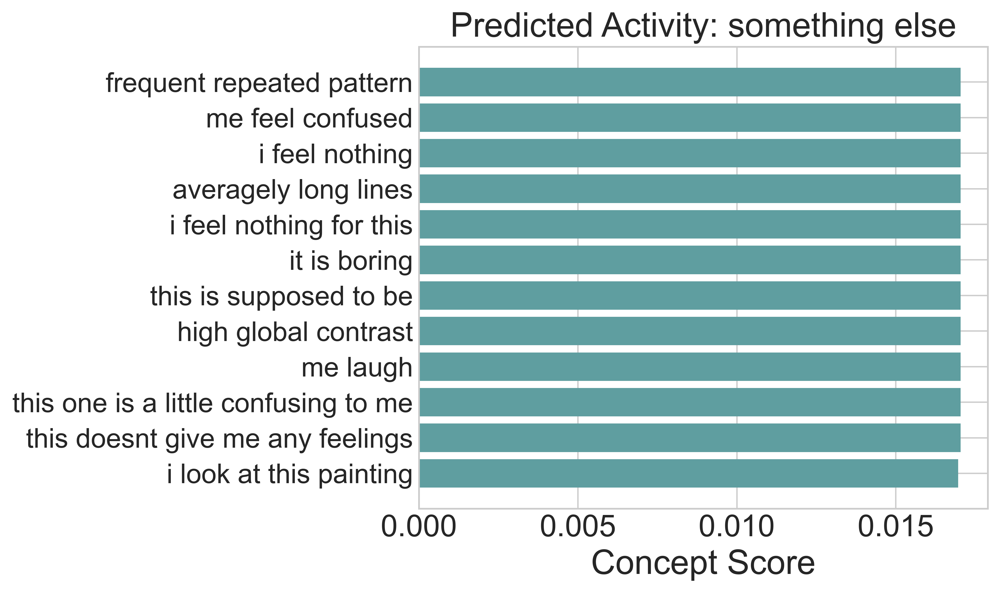

[array([[1.46894455e-02, 1.26286179e-01, 1.19626522e-03, 2.18701363e-03,
        1.80923939e-03, 9.75842953e-01, 8.15600157e-04, 9.85166967e-01,
        1.29275086e-05, 9.81741846e-01, 1.14305317e-02, 1.29505992e-03,
        1.03471875e-02, 9.18585956e-02, 9.98112917e-01, 9.75712001e-01,
        4.47115302e-03, 1.83612108e-04, 4.48167324e-04, 4.46808338e-03,
        8.24000963e-05, 3.19300294e-02, 9.81254816e-01, 8.52047961e-05,
        6.40192628e-03, 1.81853771e-04, 8.17099214e-03, 1.15754306e-02,
        1.63368285e-02, 2.74012782e-05, 5.19533787e-05, 9.17199254e-03,
        1.30876899e-03, 1.97035074e-03, 9.92020071e-01, 4.24405771e-05,
        3.90142202e-04, 4.20808792e-04, 5.25176525e-04, 1.58009529e-02,
        1.44815445e-03, 3.29375267e-04, 9.58567252e-05, 2.33000517e-03,
        1.91718340e-04, 1.50136157e-05, 8.13812017e-04, 3.38609170e-05,
        9.67396409e-05, 1.97708607e-04, 6.23849809e-01, 3.04758549e-04,
        9.85540867e-01, 8.74014804e-05, 4.71827589e-05, 1.11088

In [157]:
# Try visualise the trial model on artemis
curr_point = tensor_of_test_indices[205]
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
model = load_model(model_dir + '/final_concept_full_artemis_357_1661008473.h5')
print(f"True label is: {y_true[205]}")
# save_name = 'predicted_old_concepts.png'
pred, pred_label, pred_concepts, pred_attn = visualize_concepts(X_data[curr_point], model,
                                                                concepts_text, inv_class_dict)
print(pred)
print(pred_concepts)
print(pred_attn)

True label is: contentment


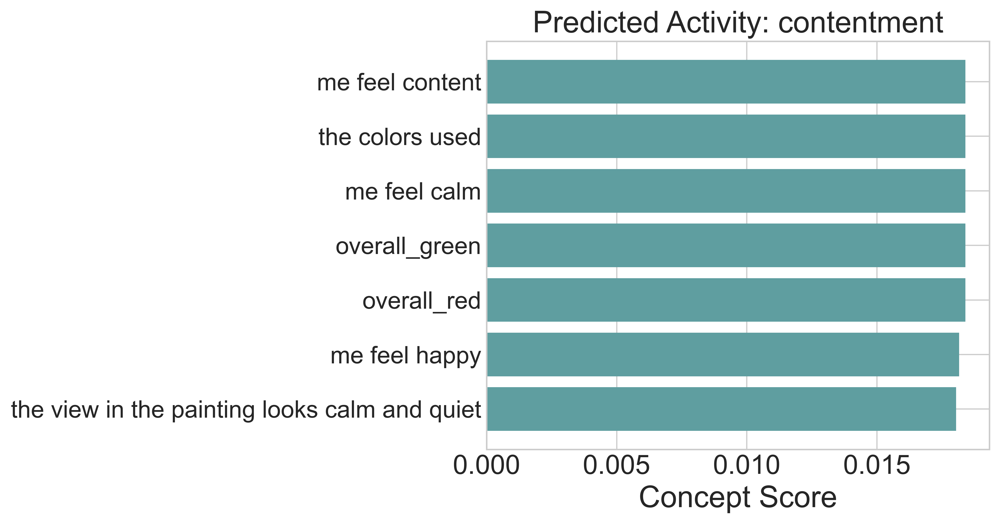

[array([[9.36646700e-01, 9.57439125e-01, 1.35958195e-04, 2.41403427e-07,
        1.71800511e-05, 1.69754028e-04, 1.41577368e-06, 3.67006660e-03,
        3.31972473e-07, 1.01548321e-04, 1.48177147e-04, 9.37670350e-01,
        4.30077314e-04, 2.10672617e-04, 8.41289759e-04, 2.16817856e-03,
        2.87509283e-05, 1.70508656e-06, 8.67134094e-01, 1.64061785e-04,
        8.67561466e-05, 1.34131060e-05, 1.68711213e-05, 1.64071685e-06,
        1.92314386e-04, 8.60851288e-01, 1.08413537e-04, 8.31931829e-04,
        6.39669815e-05, 1.71362046e-06, 7.79261995e-07, 9.29846764e-01,
        5.49830838e-05, 2.03328600e-05, 4.32510478e-06, 1.56011299e-06,
        4.82071869e-07, 5.06095827e-01, 8.85051429e-01, 1.72227621e-04,
        2.29450825e-06, 1.28005823e-07, 2.71733529e-06, 1.26684517e-05,
        2.53296434e-07, 3.04967165e-04, 5.77308765e-06, 2.16906597e-06,
        8.97014525e-06, 2.80467316e-06, 8.75250862e-07, 4.54922483e-05,
        3.99389864e-05, 1.63501156e-07, 2.30230944e-06, 1.06642

In [158]:
# Try visualise the trial model on artemis
curr_point = tensor_of_test_indices[7]
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
model = load_model(model_dir + '/final_concept_full_artemis_357_1661008473.h5')
print(f"True label is: {y_true[7]}")
# save_name = 'predicted_old_concepts.png'
pred, pred_label, pred_concepts, pred_attn = visualize_concepts(X_data[curr_point], model,
                                                                concepts_text, inv_class_dict)
print(pred)
print(pred_concepts)
print(pred_attn)

True label is: contentment


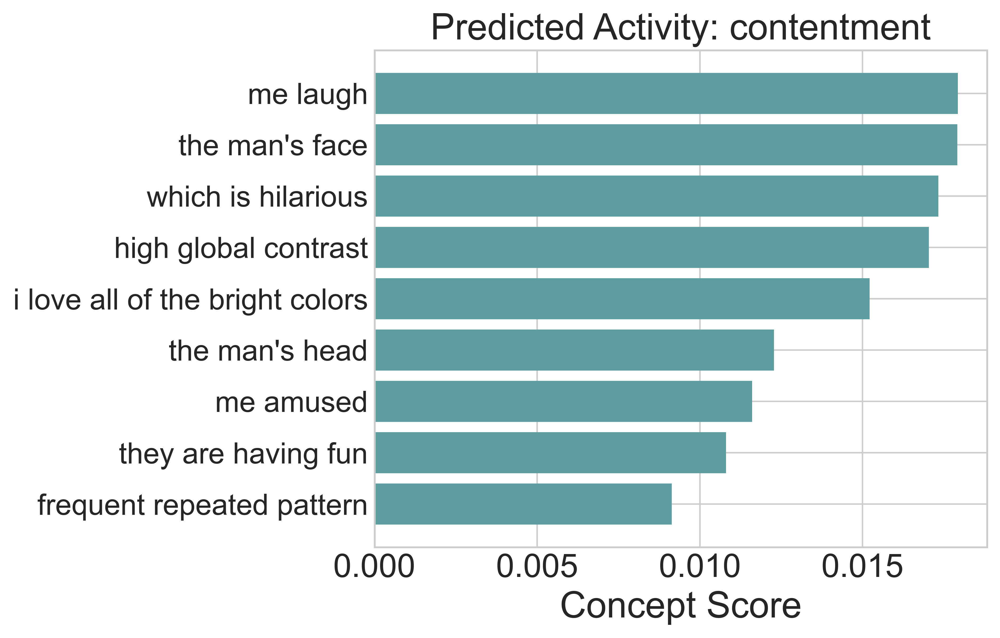

[array([[5.76985061e-01, 3.44803929e-03, 5.70965111e-02, 5.87735085e-05,
        1.15704536e-03, 9.61802363e-01, 7.57170916e-02, 7.79847205e-02,
        9.51059556e-05, 1.91302598e-02, 1.97004586e-01, 9.81628895e-04,
        3.71752709e-01, 3.15459073e-02, 2.79737622e-01, 7.53603041e-01,
        1.66749954e-03, 1.74176693e-03, 1.16047263e-03, 3.46766263e-01,
        3.24641587e-05, 1.04221702e-03, 4.02551591e-02, 9.74463637e-06,
        6.98908448e-01, 7.73913416e-05, 8.76664162e-01, 9.18477774e-04,
        1.77675813e-01, 1.25305596e-05, 2.28239696e-05, 2.48606266e-05,
        2.02531010e-01, 5.97015321e-02, 4.81685996e-02, 2.66467196e-05,
        1.31127238e-03, 4.07525113e-05, 7.85470009e-04, 1.45217776e-03,
        4.33248824e-05, 6.42806292e-04, 2.74321437e-03, 5.01994946e-05,
        1.03167440e-04, 7.58945971e-05, 2.92857587e-02, 6.80651574e-05,
        5.65789938e-02, 1.85617027e-05, 2.72327662e-03, 3.12830052e-05,
        3.76261771e-02, 1.62154436e-04, 3.10748816e-03, 1.89524

In [160]:
# Try visualise the trial model on artemis
curr_point = tensor_of_test_indices[178]
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
model = load_model(model_dir + '/final_concept_full_artemis_357_1661008473.h5')
print(f"True label is: {y_true[178]}")
# save_name = 'predicted_old_concepts.png'
pred, pred_label, pred_concepts, pred_attn = visualize_concepts(X_data[curr_point], model,
                                                                concepts_text, inv_class_dict)
print(pred)
print(pred_concepts)
print(pred_attn)

## Attention on 2000 nine labels with 347 concepts

In [174]:
import pathlib
import tensorflow as tf

def to_image_ids(file_paths):
    return [pathlib.PurePath(file_path).name[:-4] for file_path in file_paths]
    # return [re.match(r".*/([a-zA-Z0-9_]+)\.jpg", file_path).group(1) for file_path in file_paths]

# Location where 2000 subset of artemis is stored
dir = '/Users/Cherry0904/Desktop/artemis_images_2000_ds'
dataset = keras.preprocessing.image_dataset.image_dataset_from_directory(dir, image_size=(224, 224), batch_size=1,
                                                                         shuffle=False)

X_data, _, _ = ds_unzip(dataset, use_concepts=False)
X_data = resnet_v2.preprocess_input(X_data)

project_dir = '/Users/Cherry0904/Desktop/roko-for-charlize'

path = os.path.join(
    f"{project_dir}/Extracted_Concepts/artemis_2000_0.9_final_dict_old_codex.pkl")
luke_output = pd.read_pickle(path)
concepts_text = np.array(luke_output["explanations"])

labels_keys = ['id', 'label', 'concepts']
labels_dict = {key: luke_output[key] for key in labels_keys}
labels = pd.DataFrame.from_dict(labels_dict)

# binary_image_concepts = np.array(['overall_red', 'overall_green', 'overall_blue', 'large colour variation', 'high saturation', 
#                                 'high global contrast', 'high local contrast', 'frequent repeated pattern', 
#                                 'large number of lines', 'averagely long lines'])
# concepts_text = np.concatenate((binary_image_concepts, concepts_text), axis=None)
# print(concepts_text.shape)

n_concepts = 347 # 347 + 10 # Change it

ds_img_ids = to_image_ids(dataset.file_paths)
concept_list_ids = [idx_lookup(labels, "id", img_id) for img_id in ds_img_ids]
concept_list = [tf.convert_to_tensor(labels["concepts"].iloc[id]) for id in concept_list_ids] 
label_list = [labels["label"].iloc[id] for id in concept_list_ids]

num_classes = 9 # Change it
# classes = np.array(['positive', 'negative'])
# class_dict = {'positive': 0, 'negative': 1}

classes = np.array(['amusement', 'awe', 'contentment', 'excitement', 'anger', 'disgust', 'fear', 'sadness', 'something else'])

class_dict = {
    'amusement': 0,
    'awe': 1,
    'contentment': 2,
    'excitement': 3,
    'anger': 4,
    'disgust': 5, 
    'fear': 6, 
    'sadness': 7, 
    'something else': 8}

inv_class_dict = {v: k for k, v in class_dict.items()}


y_binary = [tf.constant(tf.keras.utils.to_categorical(class_dict[label], num_classes), shape=[num_classes, ]) for label in label_list] 
y_data = [{"c_probs": c, "probs": y} for c, y in zip(concept_list, y_binary)]


Found 2000 files belonging to 1 classes.


In [189]:
from nn.utils import return_predicted_class, return_attention_weights_and_index, visualize_concepts

# print(labels.index[labels['id'] == 'WSYKJR5QCQ5K'].tolist())

## shuffled_indices = [] # Copy it from img_classifier.py results
# indices = tf.range(start=0, limit=tf.shape(X_data)[0], dtype=tf.int32)
# shuffled_indices = tf.random.shuffle(indices)
indices = tf.range(start=0, limit=2000, dtype=tf.int32) # Change the number of data points/images
shuffled_indices = tf.random.shuffle(indices, seed = 789)
X_data = tf.gather(X_data, shuffled_indices)
dataset_val_point = 1700 # Change this
tensor_of_test_indices = shuffled_indices[dataset_val_point:]

# curr_point = 126
# network_type = "image_classifier_network"
# network_type = 'concept_Conv_attn'
# X_visualize = X_data[curr_point]
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
model = load_model(model_dir + '/best_concept_full_artemis_concrete_347_1660126086.h5') # '/final_concept_full_artemis_300_1660726417.h5')
# pred_class_list = [] 
# for i in range(tensor_of_test_indices.shape[0]):
#     pred_class_list.append(return_predicted_class(X_data[tensor_of_test_indices[i]], model, inv_class_dict))

# # print(pred_class_list)
# # X_visualize = X_data[tensor_of_test_indices[0]] # Loop over all test points
# # y_true = label_list[curr_point]
# y_true = []
# for i in range(tensor_of_test_indices.shape[0]):
#     y_true.append(label_list[tensor_of_test_indices[i]])
# print(y_true)
# print(concepts_text.shape)

pred_class_list_full = []
for i in range(2000):
    pred_class_list_full.append(return_predicted_class(X_data[i], model, inv_class_dict))

y_true_full = []
for i in range(2000):
    y_true_full.append(label_list[i])

In [191]:
# Print the indexes where the true label and predicted label are the same
def return_same_label_indices(a, b, label):
  return [i for i, v in enumerate(a) if v == b[i] == label]

def return_unequal_label_indices(a, b, true_label, pred_label):
  return [i for i, v in enumerate(a) if v == true_label and b[i] == pred_label]

sad_index_list = return_same_label_indices(y_true_full, pred_class_list_full, 'sadness')
fear_index_list = return_same_label_indices(y_true_full, pred_class_list_full, 'fear')
disgust_index_list = return_same_label_indices(y_true_full, pred_class_list_full, 'disgust')
awe_index_list = return_same_label_indices(y_true_full, pred_class_list_full, 'awe')
exc_index_list = return_same_label_indices(y_true_full, pred_class_list_full, 'excitement')
amu_index_list = return_same_label_indices(y_true_full, pred_class_list_full, 'amusement')
se_index_list = return_same_label_indices(y_true_full, pred_class_list_full, 'something else')



print(sad_index_list)
print(fear_index_list)
print(disgust_index_list)
print(awe_index_list)
print(exc_index_list)
print(amu_index_list)
print(se_index_list)

[]
[]
[]
[34, 49, 58, 276, 301, 401, 403, 548, 638, 672, 731, 793, 830, 882, 905, 940, 957, 1121, 1130, 1146, 1181, 1215, 1217, 1300, 1312, 1334, 1400, 1574, 1641, 1670, 1783, 1859, 1906, 1922]
[]
[64, 150, 229, 582, 607, 725, 791, 931, 935, 1080, 1244, 1360, 1946, 1987]
[3, 4, 16, 61, 135, 181, 389, 487, 541, 879, 887, 903, 954, 1030, 1251, 1252, 1392, 1545, 1766, 1829]


In [ ]:
# Try visualise the trial model on artemis
curr_point = 245
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
model = load_model(model_dir + '/best_concept_full_artemis_concrete_347_1660126086.h5')
print(f"True label is: {label_list[curr_point]}")
# save_name = 'predicted_old_concepts.png'
pred, pred_label, pred_concepts, pred_attn = visualize_concepts(X_data[curr_point], 'contentment', model,
                                                                concepts_text, inv_class_dict)
print(pred)
print(pred_concepts)
print(pred_attn)

True label is: contentment


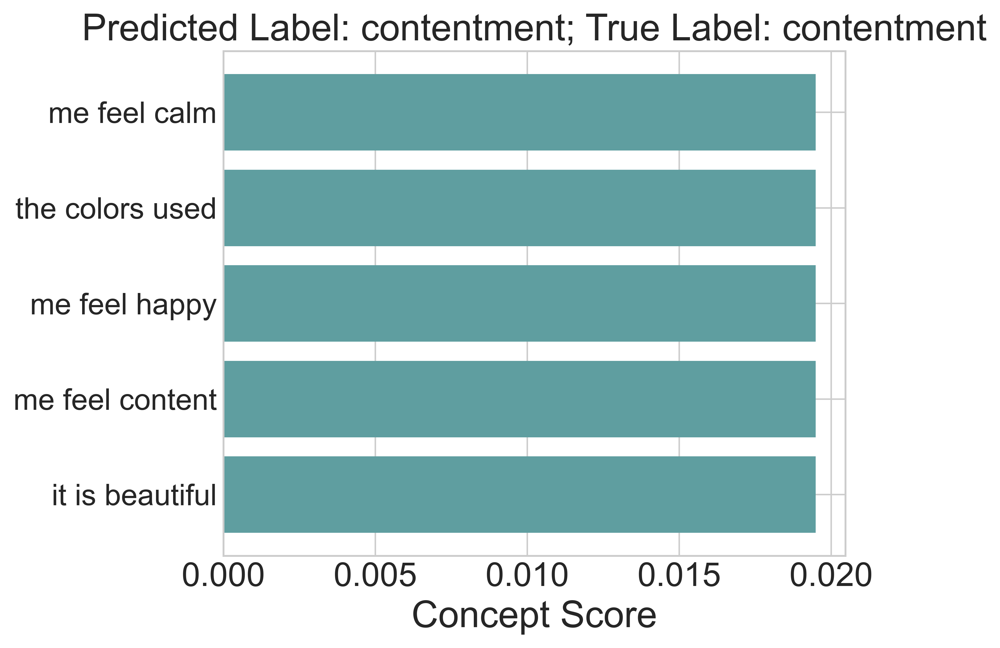

[array([[4.19979393e-02, 9.83288586e-01, 1.98060274e-03, 8.65304028e-05,
        9.08207893e-03, 1.42457187e-02, 1.17570162e-03, 4.21702862e-04,
        9.86764431e-01, 1.83612108e-04, 9.58691776e-01, 6.90797242e-06,
        2.90128589e-03, 9.02624109e-08, 6.99967146e-04, 5.38642287e-01,
        3.59540284e-02, 2.17586756e-04, 5.50448895e-04, 6.68108463e-04,
        3.51710551e-05, 9.84677613e-01, 2.04538107e-02, 2.85155184e-05,
        4.29601023e-05, 4.91446053e-06, 9.80543118e-05, 8.12660933e-01,
        9.79574203e-01, 1.35898590e-03, 9.19017293e-06, 9.72032547e-04,
        1.44966643e-05, 1.69280171e-03, 3.70183307e-06, 1.21540261e-05,
        1.72214386e-05, 1.21117060e-04, 1.38632413e-05, 1.04586670e-05,
        1.32122636e-02, 6.56127930e-04, 5.35082817e-03, 1.87577052e-06,
        1.06060161e-05, 2.17012221e-05, 8.45024884e-02, 2.33501196e-04,
        7.56297140e-07, 4.88618252e-06, 4.42004563e-07, 2.33990181e-06,
        3.61803785e-07, 1.09574199e-03, 1.17442023e-05, 1.03018

In [182]:
# Try visualise the trial model on artemis
curr_point = 245
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
model = load_model(model_dir + '/best_concept_full_artemis_concrete_347_1660126086.h5')
print(f"True label is: {label_list[curr_point]}")
# save_name = 'predicted_old_concepts.png'
pred, pred_label, pred_concepts, pred_attn = visualize_concepts(X_data[curr_point], 'contentment', model,
                                                                concepts_text, inv_class_dict)
print(pred)
print(pred_concepts)
print(pred_attn)


True label is: amusement


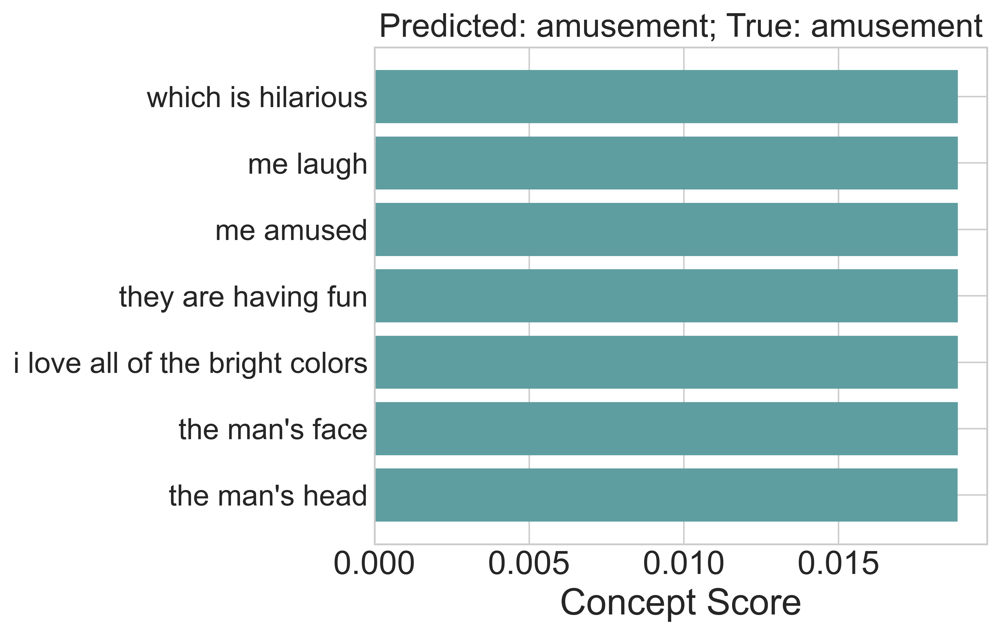

[array([[5.74254990e-03, 5.55306673e-04, 9.74561691e-01, 7.08202137e-08,
        1.01521015e-04, 9.43616450e-01, 2.43425369e-04, 9.58168221e-06,
        1.81403756e-03, 8.45680714e-01, 3.03691626e-03, 3.32683325e-04,
        1.34050846e-04, 2.42056649e-06, 7.69655228e-01, 7.07298517e-04,
        9.49352324e-01, 6.64239778e-05, 9.89300609e-01, 7.78606534e-03,
        2.57372856e-04, 4.75674868e-04, 2.82323360e-03, 4.34238063e-06,
        2.93012181e-05, 1.47095143e-05, 3.27934549e-06, 1.15516782e-03,
        7.35342503e-04, 5.10761674e-05, 3.77940778e-05, 2.87366606e-06,
        1.01939495e-05, 1.87456608e-04, 9.73046990e-05, 1.13776396e-05,
        3.06929796e-05, 3.56873572e-02, 3.21116090e-06, 8.65613856e-06,
        3.84633095e-05, 8.37829709e-03, 5.12882034e-05, 3.72573122e-05,
        2.45204637e-06, 3.03654247e-06, 7.37410784e-03, 4.37501073e-03,
        5.96374273e-03, 2.44790840e-06, 1.87278292e-05, 3.71756937e-06,
        7.20839162e-05, 9.93908107e-01, 8.26205360e-06, 7.05674

In [183]:
# Try visualise the trial model on artemis
curr_point = 279
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
model = load_model(model_dir + '/best_concept_full_artemis_concrete_347_1660126086.h5')
print(f"True label is: {label_list[curr_point]}")
# save_name = 'predicted_old_concepts.png'
pred, pred_label, pred_concepts, pred_attn = visualize_concepts(X_data[curr_point], 'amusement', model,
                                                                concepts_text, inv_class_dict)
print(pred)
print(pred_concepts)
print(pred_attn)

True label is: awe


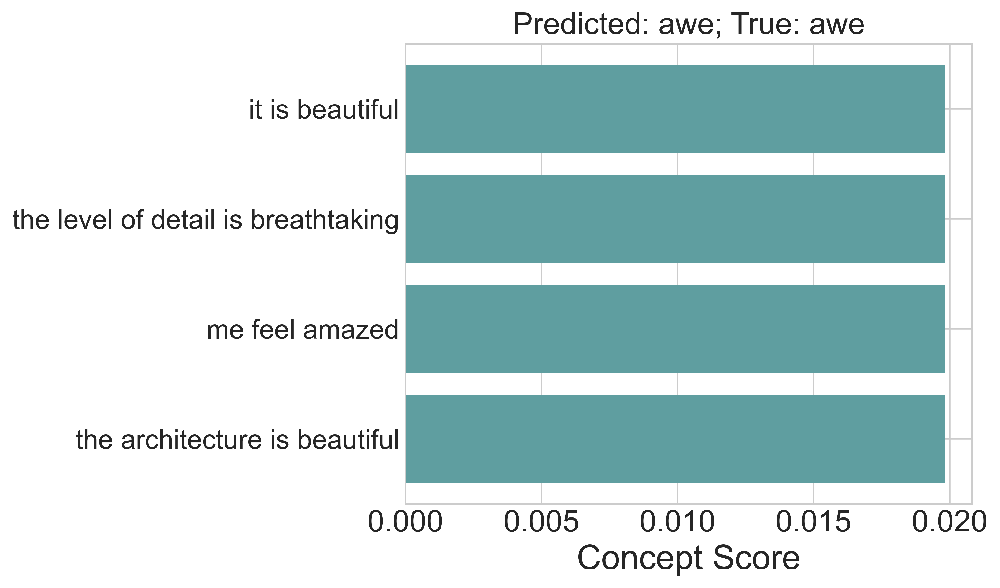

[array([[1.01320416e-01, 2.63893306e-02, 6.80686981e-06, 2.22600702e-05,
        1.17245913e-02, 1.68508291e-03, 2.98112631e-04, 4.54574823e-04,
        4.21868861e-02, 1.21319999e-05, 9.74172950e-01, 1.63823366e-04,
        5.58650494e-03, 5.82659823e-07, 1.30861998e-04, 1.78471804e-02,
        2.39649415e-02, 1.81555748e-04, 6.06773796e-08, 9.70924556e-01,
        2.32139482e-05, 2.76379764e-01, 1.47406340e-01, 1.31517649e-04,
        2.18782873e-07, 3.33363317e-07, 2.79456377e-03, 1.59024000e-02,
        2.30011046e-02, 3.10987234e-04, 1.63584609e-05, 2.51382589e-04,
        4.34788944e-07, 1.32980943e-02, 6.24865243e-06, 1.29691659e-06,
        1.70037731e-06, 7.30820875e-06, 1.35655265e-08, 1.64487247e-07,
        1.41799450e-04, 9.72839236e-01, 8.31678510e-03, 7.10576444e-07,
        1.74057041e-05, 9.69847497e-06, 1.82495236e-01, 1.44627690e-03,
        8.13101542e-06, 1.44148288e-07, 9.18367505e-07, 9.76391602e-05,
        1.33925905e-05, 1.64970402e-06, 1.93021197e-06, 5.97976

In [184]:
# Try visualise on the trial model on artemis
curr_point = 250
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
model = load_model(model_dir + '/best_concept_full_artemis_concrete_347_1660126086.h5')
print(f"True label is: {label_list[curr_point]}")
# save_name = 'predicted_old_concepts.png'
pred, pred_label, pred_concepts, pred_attn = visualize_concepts(X_data[curr_point], 'awe', model,
                                                                concepts_text, inv_class_dict)
print(pred)
print(pred_concepts)
print(pred_attn)

True label is: fear


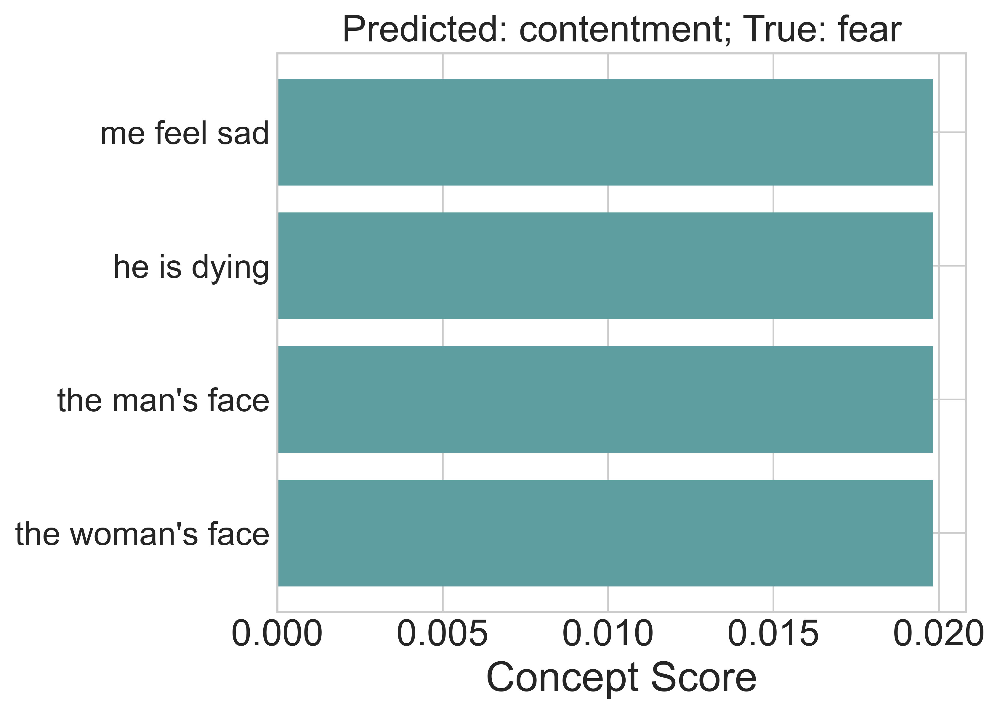

[array([[9.92228448e-01, 8.33779573e-04, 1.53720379e-04, 4.66118981e-05,
        3.30362916e-02, 1.54741049e-01, 1.80803067e-06, 7.80102273e-05,
        3.74618173e-03, 3.26642394e-03, 1.04853511e-03, 1.16446040e-06,
        2.19765902e-02, 1.15823823e-04, 9.37367149e-05, 5.86003065e-04,
        9.75829005e-01, 3.91212325e-06, 4.53825942e-06, 4.87983227e-04,
        2.67834309e-07, 5.55902719e-04, 9.85578179e-01, 2.60608942e-07,
        9.92066362e-07, 7.81048439e-05, 3.32680338e-06, 1.25795603e-04,
        4.06056643e-04, 4.73535096e-07, 1.93104779e-06, 2.79910266e-02,
        8.48333657e-05, 1.09049082e-02, 1.39150325e-05, 1.56751383e-07,
        3.54107647e-06, 2.47359276e-04, 1.21727192e-06, 1.44388173e-06,
        1.23607160e-05, 4.17172909e-04, 1.02729201e-02, 4.73788049e-07,
        3.36982771e-06, 1.12465341e-05, 9.90845799e-01, 1.70881924e-06,
        3.16768885e-04, 3.13520432e-04, 7.12886219e-07, 9.42051411e-04,
        7.36072479e-06, 1.08080558e-05, 8.76343336e-07, 5.30014

In [186]:
# Try visualise the trial model on artemis
curr_point = 566
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
model = load_model(model_dir + '/best_concept_full_artemis_concrete_347_1660126086.h5')
print(f"True label is: {label_list[curr_point]}")
# save_name = 'predicted_old_concepts.png'
pred, pred_label, pred_concepts, pred_attn = visualize_concepts(X_data[curr_point], 'fear', model,
                                                                concepts_text, inv_class_dict)
print(pred)
print(pred_concepts)
print(pred_attn)

True label is: disgust


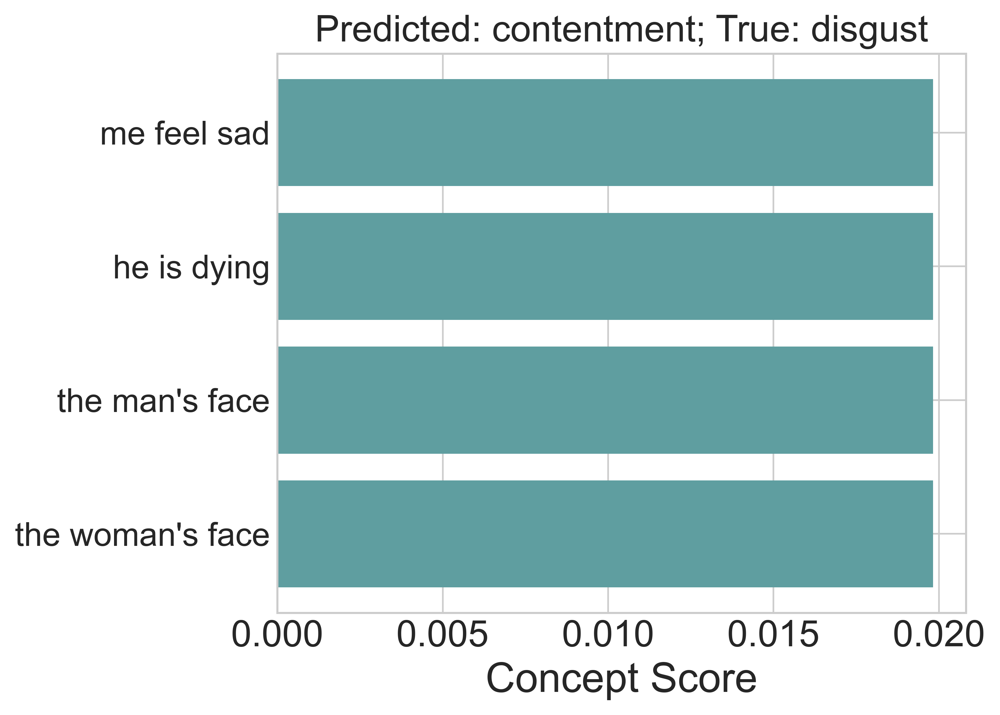

[array([[9.47340727e-01, 3.23265791e-04, 1.60008669e-04, 9.21294923e-05,
        1.54926181e-02, 1.89435482e-03, 2.11372972e-03, 5.96314669e-04,
        6.99430704e-04, 3.69089842e-03, 7.71978498e-03, 2.14457512e-04,
        1.26526654e-02, 3.93239316e-06, 2.28860974e-03, 8.19231500e-05,
        8.98929298e-01, 8.06081295e-03, 1.45107508e-04, 3.20184231e-03,
        1.48861204e-06, 1.41590834e-04, 9.46137786e-01, 7.98790370e-06,
        6.73974910e-06, 1.06298830e-05, 1.48743391e-04, 8.61904191e-05,
        7.04398844e-05, 2.74592638e-03, 4.71412392e-07, 1.56876445e-03,
        5.75618542e-05, 3.55388224e-02, 9.73355174e-01, 9.48756224e-06,
        3.72212094e-06, 2.31589866e-06, 1.49199036e-06, 1.88510555e-07,
        2.75671482e-04, 2.75832415e-03, 1.27276182e-02, 1.09093071e-06,
        1.45256519e-04, 1.25288204e-06, 9.60316777e-01, 2.09042430e-02,
        5.54915050e-06, 1.51232541e-06, 7.38524022e-07, 1.79855233e-05,
        6.03833860e-06, 1.83880329e-04, 7.45080456e-07, 3.02599

In [187]:
# Try visualise the trial model on artemis
curr_point = 138
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
model = load_model(model_dir + '/best_concept_full_artemis_concrete_347_1660126086.h5')
print(f"True label is: {label_list[curr_point]}")
# save_name = 'predicted_old_concepts.png'
pred, pred_label, pred_concepts, pred_attn = visualize_concepts(X_data[curr_point], 'disgust', model,
                                                                concepts_text, inv_class_dict)
print(pred)
print(pred_concepts)
print(pred_attn)

True label is: something else


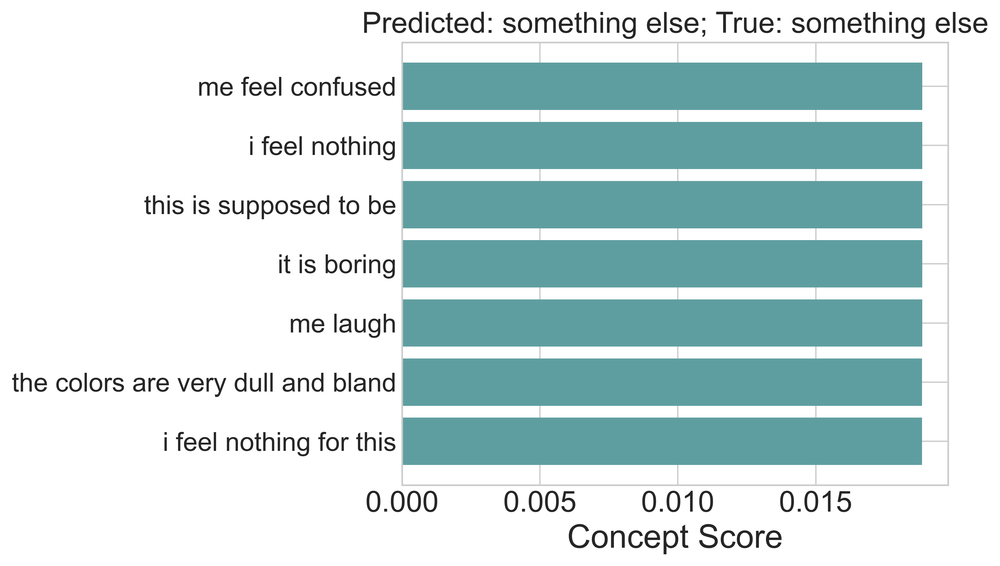

[array([[2.63890028e-02, 1.04114413e-03, 1.24328732e-02, 1.35928392e-04,
        9.74954963e-01, 9.61948752e-01, 6.13443190e-05, 2.31593847e-04,
        4.06908989e-03, 3.02669406e-03, 1.09025836e-03, 1.40786171e-04,
        9.74100113e-01, 1.97428562e-05, 2.32490897e-03, 4.27067280e-04,
        1.19752020e-01, 1.39863168e-05, 8.65101814e-04, 1.74126029e-03,
        5.03181218e-05, 7.38024712e-04, 2.27520764e-02, 4.94470114e-05,
        2.82436609e-04, 1.37412548e-03, 2.17825174e-04, 5.14835119e-04,
        7.66068697e-04, 3.67983957e-05, 2.44140625e-04, 9.15771723e-01,
        7.71615851e-06, 2.57890522e-02, 2.21665832e-05, 1.41650438e-04,
        2.10464001e-04, 3.28212976e-04, 4.96045743e-07, 1.31917000e-03,
        2.47043371e-03, 9.19878483e-04, 9.72186983e-01, 4.96957682e-07,
        5.84274530e-04, 2.19434642e-05, 2.22622156e-02, 2.04026699e-04,
        2.53319740e-04, 4.74547378e-05, 2.72947227e-06, 4.52009737e-02,
        5.57446438e-05, 1.22547150e-03, 1.17781992e-05, 3.97771

In [188]:
# Try visualise the trial model on artemis
curr_point = 189
model_dir = "/Users/Cherry0904/Desktop/roko-for-charlize/Thesis_Data/Models"
model = load_model(model_dir + '/best_concept_full_artemis_concrete_347_1660126086.h5')
print(f"True label is: {label_list[curr_point]}")
# save_name = 'predicted_old_concepts.png'
pred, pred_label, pred_concepts, pred_attn = visualize_concepts(X_data[curr_point], 'something else', model,
                                                                concepts_text, inv_class_dict)
print(pred)
print(pred_concepts)
print(pred_attn)

In [17]:
from nn.utils import visualize_concepts

# print(labels.index[labels['id'] == 'WSYKJR5QCQ5K'].tolist())

curr_point = 1
# network_type = "image_classifier_network"
# network_type = 'concept_Conv_attn'
X_visualize = X_data[curr_point]
# X_visualize = X_test0[curr_point]
y_true = label_list[curr_point]
# y_true = inv_class_dict[np.argmax(y_test_binary[curr_point])]
# curr_id = id_test0[122]
# print(curr_id)
# print(f"The video id we are observing is {curr_id}")
# print(f"The image id we are observing is {birds_img_ids[curr_point]}")
print(concepts_text.shape)
print(y_true)

(130,)
awe


### Joint training beta analysis

In [237]:
indices = [5, 3, 2, 1.5, 1.2, 1, 0.8, 0.5, 0.2]
mean_a = [0.707, 0.707, 0.705, 0.713, 0.725, 0.732, 0.642, 0.589, 0.577]
std_a = [0.008, 0.010, 0.019, 0.023, 0.017, 0.025, 0.012, 0.021, 0.026]
mean_f = [0.414, 0.432, 0.472, 0.555, 0.593, 0.638, 0.611, 0.575, 0.552]
std_f = [0.015,0.015, 0.024, 0.018, 0.009, 0.009, 0.013, 0.011, 0.017]

In [231]:
plt.style.use('seaborn-whitegrid')
plt.rcParams['figure.dpi'] = 800
# plt.rcParams["axes.grid"] = False
plt.rcParams["axes.edgecolor"] = "0.15"
plt.rcParams["axes.linewidth"]  = 0.75
plt.rcParams["axes.facecolor"] = 'white'

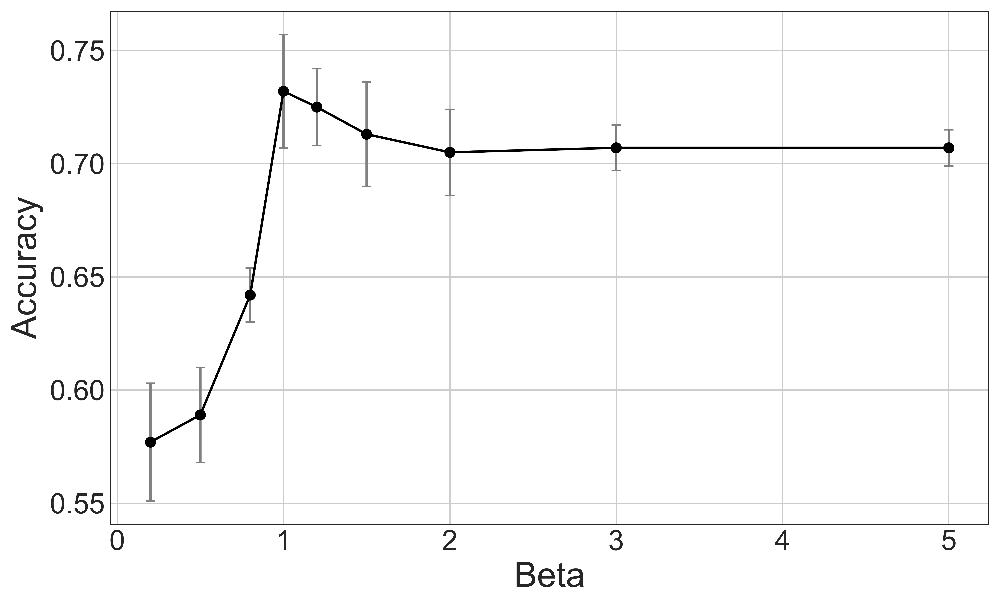

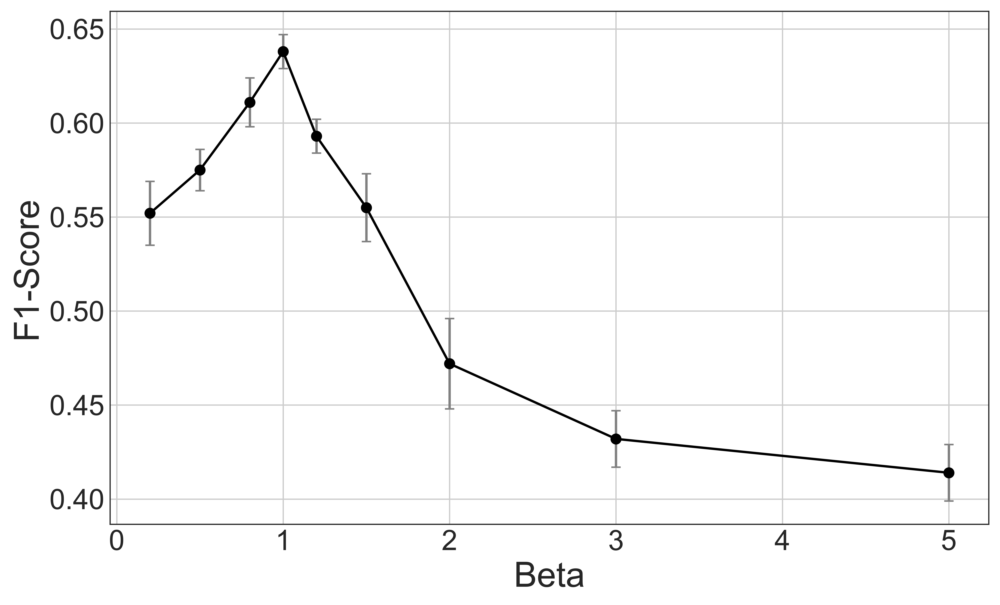

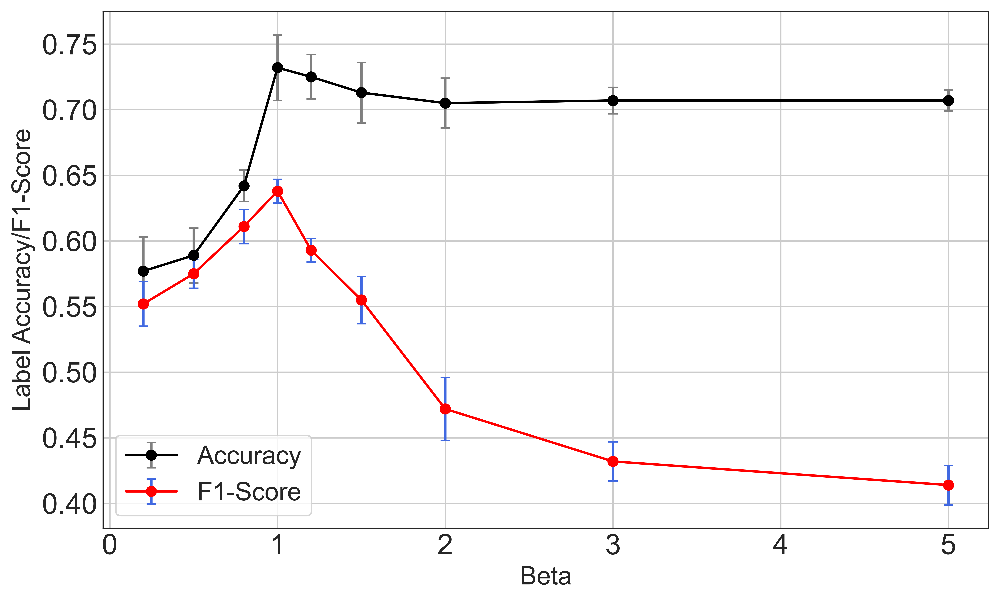

In [238]:
plt.figure(figsize=(10, 6))
plt.errorbar(indices, mean_a, yerr=std_a, fmt='-ok', ecolor='gray', capsize=3);
# plt.ylim([0.5,0.75])
# plt.xticks(fontsize=14, rotation=90)

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Beta', fontsize=22)
plt.ylabel('Accuracy', fontsize=22)
# plt.savefig('Accuracy')
plt.show()

plt.figure(figsize=(10, 6))
plt.errorbar(indices, mean_f, yerr=std_f, fmt='-ok', ecolor='gray', capsize=3);
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Beta', fontsize=22)
plt.ylabel('F1-Score', fontsize=22)
# plt.savefig('F1_score')
plt.show()

plt.figure(figsize=(10, 6))
plt.errorbar(indices, mean_a, yerr=std_a, fmt='-ok', ecolor='gray', capsize=3);
plt.errorbar(indices, mean_f, yerr=std_f, fmt='-or', ecolor='royalblue', capsize=3);
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Beta', fontsize=16)
plt.ylabel('Label Accuracy/F1-Score', fontsize=16)
plt.legend(['Accuracy', 'F1-Score'], fontsize=16, loc=3, frameon=True)
# plt.savefig('both')
plt.show()

In [259]:
indices = [5, 3, 2, 1.5, 1.2, 1, 0.8, 0.5, 0.2]
mean_p = [0.713, 0.552, 0.302, 0.198, 0.128, 0.111, 0.101, 0.074, 0.036]
std_p = [0.008, 0.013, 0.052, 0.062, 0.026, 0.016, 0.029, 0.010, 0.002]
mean_r = [0.026, 0.076, 0.151, 0.226, 0.284, 0.289, 0.282, 0.282, 0.340]
std_r = [0.004, 0.018, 0.031, 0.048, 0.015, 0.006, 0.027, 0.043, 0.026]

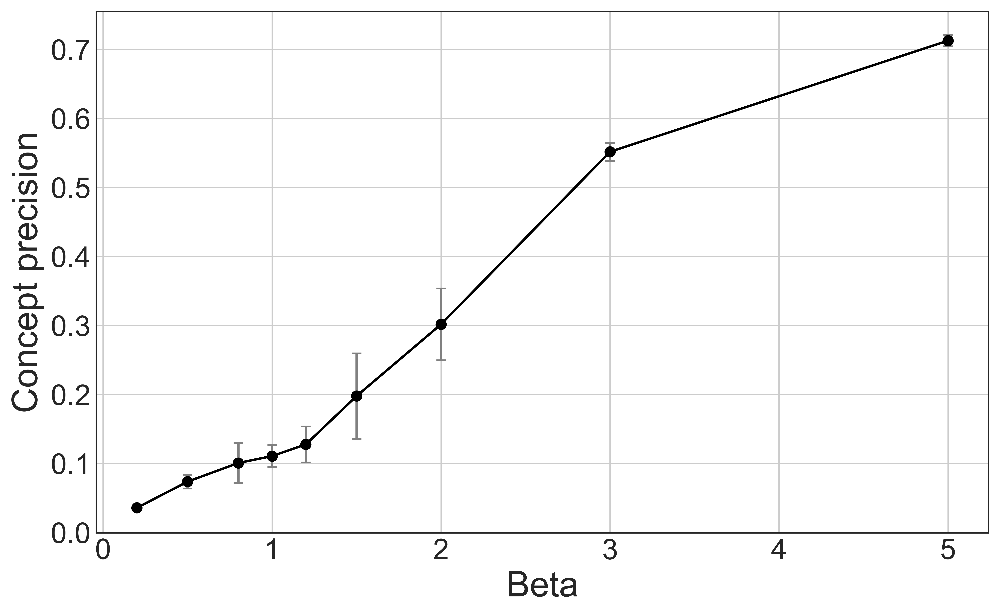

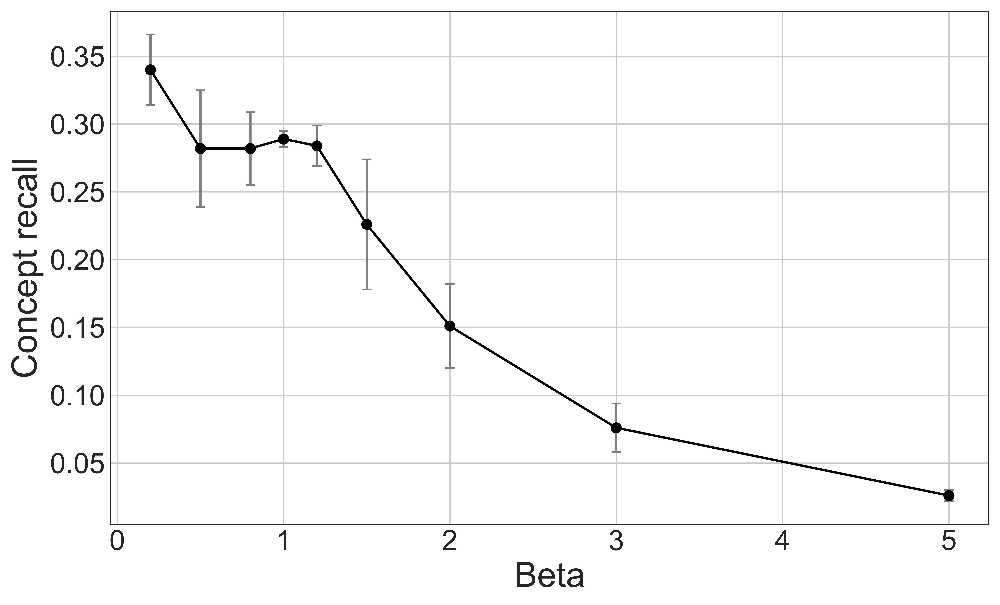

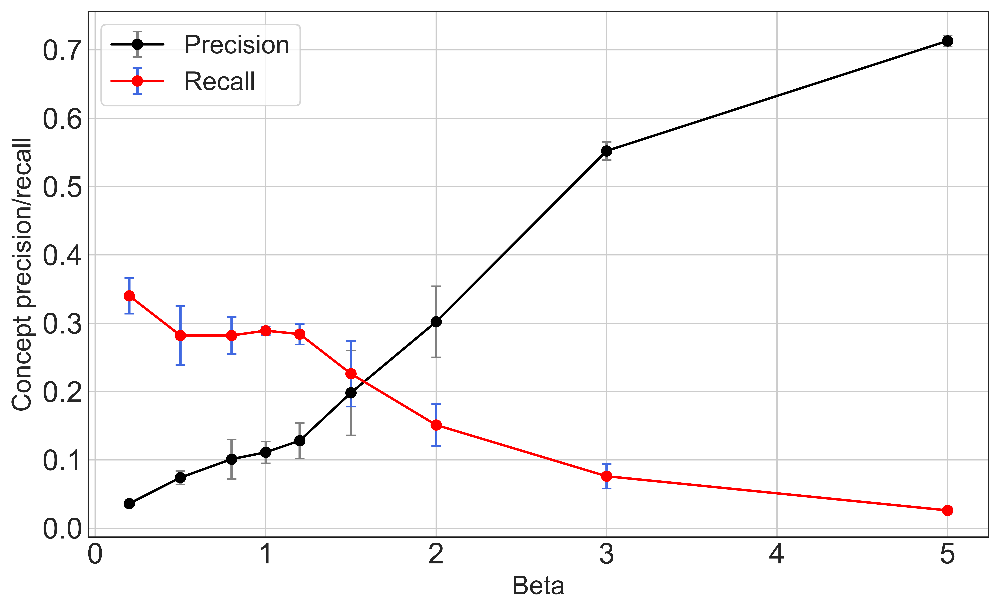

In [260]:
plt.figure(figsize=(10, 6))
plt.errorbar(indices, mean_p, yerr=std_p, fmt='-ok', ecolor='gray', capsize=3);
# plt.ylim([0.5,0.75])
# plt.xticks(fontsize=14, rotation=90)

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Beta', fontsize=22)
plt.ylabel('Concept precision', fontsize=22)
# plt.savefig('Accuracy')
plt.show()

plt.figure(figsize=(10, 6))
plt.errorbar(indices, mean_r, yerr=std_r, fmt='-ok', ecolor='gray', capsize=3);
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Beta', fontsize=22)
plt.ylabel('Concept recall', fontsize=22)
# plt.savefig('F1_score')
plt.show()

plt.figure(figsize=(10, 6))
plt.errorbar(indices, mean_p, yerr=std_p, fmt='-ok', ecolor='gray', capsize=3);
plt.errorbar(indices, mean_r, yerr=std_r, fmt='-or', ecolor='royalblue', capsize=3);
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Beta', fontsize=16)
plt.ylabel('Concept precision/recall', fontsize=16)
plt.legend(['Precision', 'Recall'], fontsize=16, loc=2, frameon=True)
# plt.savefig('both')
plt.show()

### Concept groups by averaged attention weights

<BarContainer object of 4 artists>

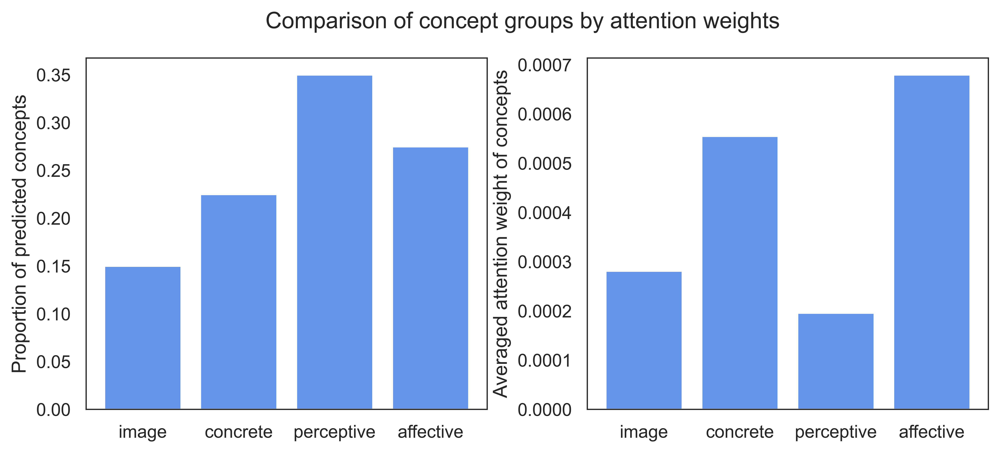

In [ ]:
# Concepts to labels: attention weights by concept groups
plt.rcParams['figure.dpi'] = 800
plt.rcParams["axes.grid"] = False
plt.rcParams["axes.edgecolor"] = "0.15"
plt.rcParams["axes.linewidth"]  = 0.75
plt.rcParams["axes.facecolor"] = 'white'

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(10)
fig.set_figheight(4)
plt.subplots_adjust(wspace=0.25)
plt.grid(False)
ax1.set_ylabel("Proportion of predicted concepts")
fig.suptitle("Comparison of concept groups by attention weights", size=14)
ax1.bar(x=["image", "concrete", "perceptive", "affective"],
        # ax1.bar(x=["old_concepts", "new_concepts"],
        height=[6/40, 9/40, 14/40, 11/40],
        capsize=4, color='cornflowerblue')
plt.grid(False)
ax2.set_ylabel("Averaged attention weight of concepts")
# ax2.set_ylim(0.63, 0.68)
ax2.bar(x=["image", "concrete", "perceptive", "affective"],
        # ax2.bar(x=["old_concepts", "new_concepts"],
        height=[0.0002812072945666667, 0.0005549421152888888, 0.00019579188992142858, 0.0006795307174818182],
        capsize=4, color='cornflowerblue')

<BarContainer object of 4 artists>

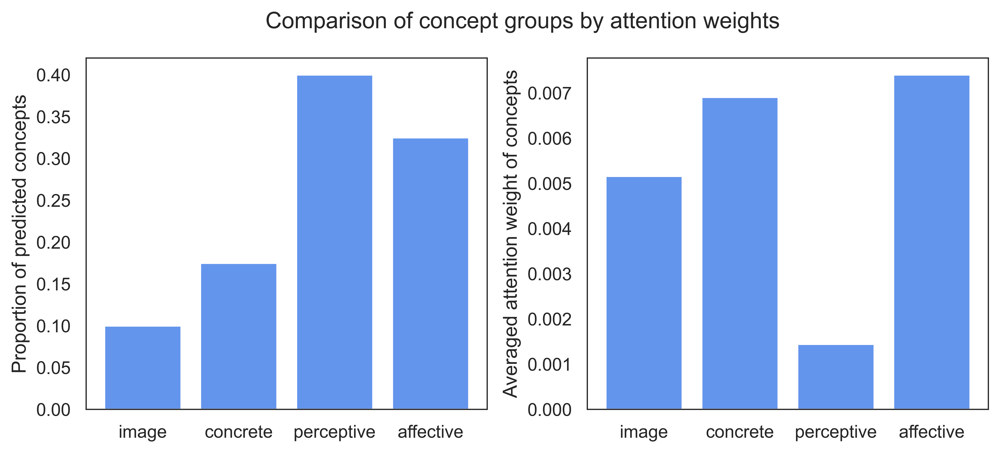

In [ ]:
# Joint training: attention weights by concept groups
plt.rcParams['figure.dpi'] = 800
plt.rcParams["axes.grid"] = False
plt.rcParams["axes.edgecolor"] = "0.15"
plt.rcParams["axes.linewidth"]  = 0.75
plt.rcParams["axes.facecolor"] = 'white'

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(10)
fig.set_figheight(4)
plt.subplots_adjust(wspace=0.25)
plt.grid(False)
ax1.set_ylabel("Proportion of predicted concepts")
fig.suptitle("Comparison of concept groups by attention weights", size=14)
ax1.bar(x=["image", "concrete", "perceptive", "affective"],
        # ax1.bar(x=["old_concepts", "new_concepts"],
        height=[4/40, 7/40, 16/40, 13/40],
        capsize=4, color='cornflowerblue')
plt.grid(False)
ax2.set_ylabel("Averaged attention weight of concepts")
# ax2.set_ylim(0.63, 0.68)
ax2.bar(x=["image", "concrete", "perceptive", "affective"],
        # ax2.bar(x=["old_concepts", "new_concepts"],
        height=[0.0051604663062, 0.006907882531825, 0.0014459448300937494, 0.007401441628192308],
        capsize=4, color='cornflowerblue')